In [24]:
# import sys
# import tensorflow as tf
# import keras
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns
# import plotly
# import cv2
# from sklearn import __version__ as sklearn_version

# print("TensorFlow:", tf.__version__)
# print("Keras:", keras.__version__)
# print("Python:", sys.version)
# print("OpenCV:", cv2.__version__)
# print("scikit-learn:", sklearn_version)

In [25]:
# from tensorflow.keras.utils import to_categorical
# from keras.models import Sequential
# from keras.layers import Convolution2D,Dense,MaxPool2D,Activation,Dropout,Flatten
# from keras.layers import GlobalAveragePooling2D
# from keras.optimizers import Adam
# from sklearn.model_selection import train_test_split
# from keras.layers import BatchNormalization
# import os 
# import pandas as pd
# import plotly.graph_objs as go
# import matplotlib.ticker as ticker
# import matplotlib.pyplot as plt
# import seaborn as sns
# import plotly.express as px
# import cv2
# import numpy as np
# from sklearn.model_selection import train_test_split

In [26]:
# System and data handling
import os 
import sys
import numpy as np
import pandas as pd

from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler

# Deep Learning imports - GPU Configuration must come right after first TF import
import tensorflow as tf

# Configure GPU Memory Growth
physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) > 0:
    try:
        for device in physical_devices:
            tf.config.experimental.set_memory_growth(device, True)
        print("GPU memory growth enabled")
    except RuntimeError as e:
        print(f"GPU memory growth configuration error: {e}")

# Rest of Deep Learning imports
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv2D, Dense, MaxPooling2D, Activation, Dropout, Flatten
from tensorflow.keras.layers import GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import plotly.express as px
import matplotlib.ticker as ticker

# Image processing and ML
import cv2
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, balanced_accuracy_score

# Print versions and GPU availability
print("Python version:", sys.version)
print("TensorFlow version:", tf.__version__)
print("GPU Available:", tf.config.list_physical_devices('GPU'))

GPU memory growth enabled
Python version: 3.11.11 (main, Dec  4 2024, 08:55:08) [GCC 13.2.0]
TensorFlow version: 2.15.0
GPU Available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [27]:
# import sys
# print(sys.executable)


In [28]:
# Step 1: Define the Dataset Path
# Specify the folder path where the dataset is stored for both training and testing sets.
dataset_folder = '/home/peter/Desktop/TU PHD/Project Apple-leaves-pathology/Apple_Data'

# Step 2: Load the CSV Files
# Load the training and testing datasets from the CSV files.
# train.csv contains the image IDs and associated labels (healthy, multiple_diseases, rust, scab).
# test.csv is used for generating predictions for evaluation.
train = pd.read_csv(os.path.join(dataset_folder, "train.csv"))
test = pd.read_csv(os.path.join(dataset_folder, "test.csv"))  # Load test data if available

# Step 3: Data Preprocessing - Update Image Filenames
# Append '.jpg' extension to the image IDs in both train and test datasets to match the actual filenames.
train['image_id'] = train['image_id'].apply(lambda x: x + '.jpg')
test['image_id'] = test['image_id'].apply(lambda x: x + '.jpg')  # Update for test set if applicable

# Step 4: Preview the Training Dataset
# Display the first few entries of the training DataFrame to confirm the data loading and processing.
print("Preview of the Training Dataset:")
display(train.head())  # Enhanced with display for better visualization in notebooks


Preview of the Training Dataset:


,image_id,healthy,multiple_diseases,rust,scab
0,Train_0.jpg,0,0,0,1
1,Train_1.jpg,0,1,0,0
2,Train_2.jpg,1,0,0,0
3,Train_3.jpg,0,0,1,0
4,Train_4.jpg,1,0,0,0


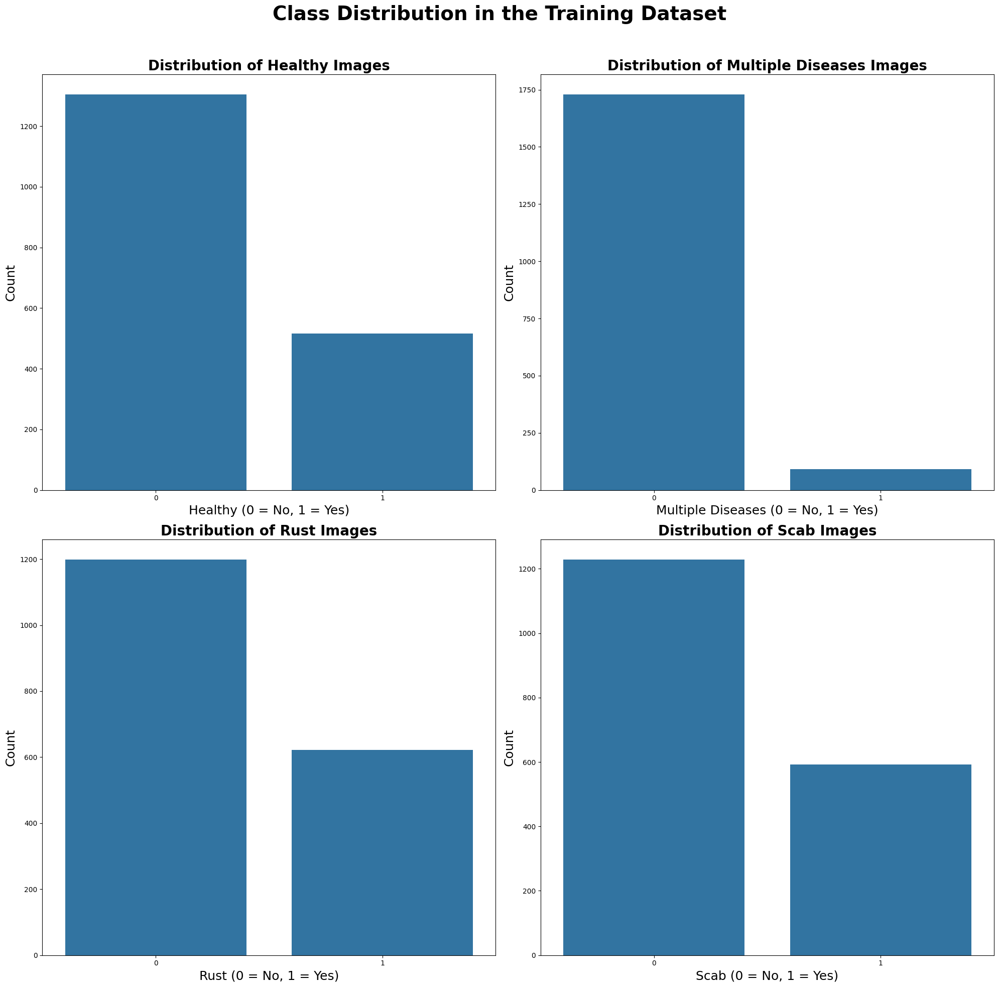

In [29]:
# Step 1: Visualize Class Distribution in the Training Dataset
# The training dataset consists of four classes: healthy, multiple_diseases, rust, and scab.
# We use bar plots to visualize the count of images in each class to understand the distribution and potential class imbalance.

fig, ax = plt.subplots(2, 2, figsize=(20, 20))  # Create a 2x2 grid of subplots for better layout

# Step 2: Plot the Distribution of "Healthy" Images
sns.barplot(y=train.healthy.value_counts(), x=train.healthy.value_counts().index, ax=ax[0, 0])
ax[0, 0].set_title("Distribution of Healthy Images", size=20, fontweight='bold')
ax[0, 0].set_xlabel('Healthy (0 = No, 1 = Yes)', size=18)
ax[0, 0].set_ylabel('Count', size=18)

# Step 3: Plot the Distribution of "Multiple Diseases" Images
sns.barplot(y=train.multiple_diseases.value_counts(), x=train.multiple_diseases.value_counts().index, ax=ax[0, 1])
ax[0, 1].set_title("Distribution of Multiple Diseases Images", size=20, fontweight='bold')
ax[0, 1].set_xlabel('Multiple Diseases (0 = No, 1 = Yes)', size=18)
ax[0, 1].set_ylabel('Count', size=18)

# Step 4: Plot the Distribution of "Rust" Images
sns.barplot(y=train.rust.value_counts(), x=train.rust.value_counts().index, ax=ax[1, 0])
ax[1, 0].set_title("Distribution of Rust Images", size=20, fontweight='bold')
ax[1, 0].set_xlabel('Rust (0 = No, 1 = Yes)', size=18)
ax[1, 0].set_ylabel('Count', size=18)

# Step 5: Plot the Distribution of "Scab" Images
sns.barplot(y=train.scab.value_counts(), x=train.scab.value_counts().index, ax=ax[1, 1])
ax[1, 1].set_title("Distribution of Scab Images", size=20, fontweight='bold')
ax[1, 1].set_xlabel('Scab (0 = No, 1 = Yes)', size=18)
ax[1, 1].set_ylabel('Count', size=18)

# Step 6: Final Adjustments for Better Visualization
plt.suptitle("Class Distribution in the Training Dataset", size=28, fontweight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to include the main title
plt.show()  # Display the plots


In [30]:
# Step 1: Image Data Preprocessing for Plant Pathology Classification
# Purpose: This cell reads and processes images from the dataset folder. Images are resized for consistent input dimensions 
# to the neural network and stored in a numpy array for efficient batch processing.

# Initialize an empty list to store the processed images
img = []

# Retrieve the list of image filenames from the 'train' DataFrame
filename = train['image_id']

# Step 2: Iterate through Each Image in the Training Set
# Each image is loaded, resized, and stored for further processing.
for file in filename:
    # Construct the complete path to each image file in the dataset directory
    image_path = os.path.join(dataset_folder, "images", file)
    
    # Read the image using OpenCV (cv2)
    image = cv2.imread(image_path)
    
    if image is not None:
        # Resize the image to (256, 256) pixels (height, width) for uniformity across the dataset
        res = cv2.resize(image, (224, 224))
        
        # Append the resized image to the list
        img.append(res)
    else:
        # Handle errors in image loading gracefully
        print(f"Error: Could not read image '{file}' from path '{image_path}'. Skipping this image.")

# Step 3: Convert the List of Images into a Numpy Array
# This format is suitable for feeding into a Convolutional Neural Network (CNN) model.
img = np.array(img)

# Display a message indicating the successful completion of image preprocessing
print(f"Total images successfully loaded and processed: {len(img)}")


Total images successfully loaded and processed: 1821


In [31]:
# Step 4: Inspect the Shape of the Processed Image Array
# Purpose: Checking the shape of the `img` array ensures that all images have been loaded correctly
# and verifies the dimensions before feeding them into the neural network for training.

# Print the shape of the numpy array containing the processed images
print(f"Shape of the processed image array: {img.shape}")

# Explanation of the Output:
# The shape should be in the format: (Total Images, Height, Width, Channels)
# For example, if we have 1821 images, each resized to 256x256 pixels, with 3 channels (RGB):
# Expected Output: (1821, 256, 256, 3)


Shape of the processed image array: (1821, 224, 224, 3)


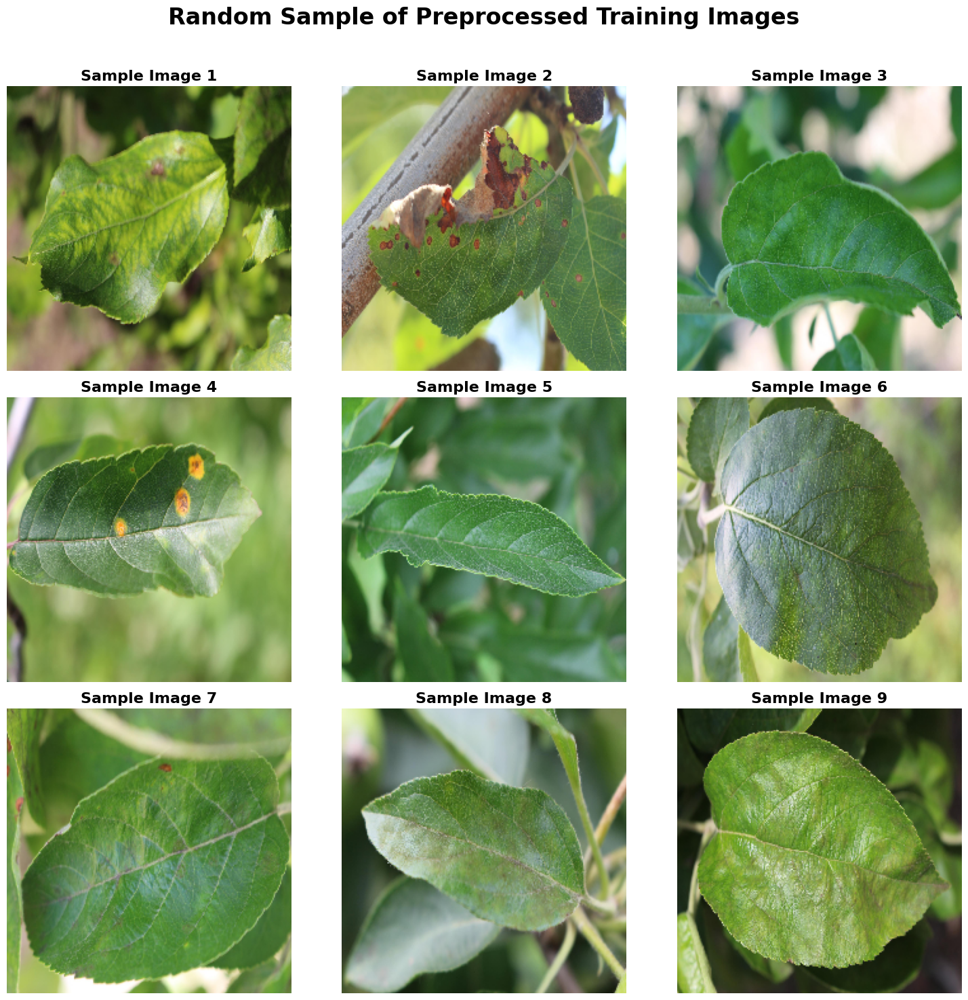

In [32]:
# Step 5: Visualize a Random Sample of Preprocessed Images from the Training Dataset
# Purpose: To confirm that the images have been correctly loaded, resized, and formatted.
# This visualization allows us to inspect the data visually and ensures that images are consistent in shape and quality.

plt.figure(figsize=(15, 15))  # Create a figure of size 15x15 for better visibility of multiple images

# Step 6: Display a 3x3 Grid of Sample Images
# Iterate through the first 9 images in the dataset and plot them in a 3x3 grid.
for i in range(9):
    plt.subplot(3, 3, i + 1)  # Define a 3x3 subplot grid and select the (i+1)-th position
    
    # Correct the color format from BGR to RGB for accurate display
    image_rgb = cv2.cvtColor(img[i], cv2.COLOR_BGR2RGB)  
    
    # Display the image in the correct color format
    plt.imshow(image_rgb)
    
    # Add a title to each subplot indicating its index
    plt.title(f"Sample Image {i+1}", fontsize=16, fontweight='bold')
    plt.axis('off')  # Hide the axis for a cleaner look

# Step 7: Final Adjustments and Display
plt.suptitle("Random Sample of Preprocessed Training Images", size=24, fontweight='bold')  # Main title for the entire figure
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to avoid overlap
plt.show()  # Display the complete 3x3 grid of sample images


Implementing Chen System for Chaotic Noise...

Visualizing Chaotic Noise Effect...


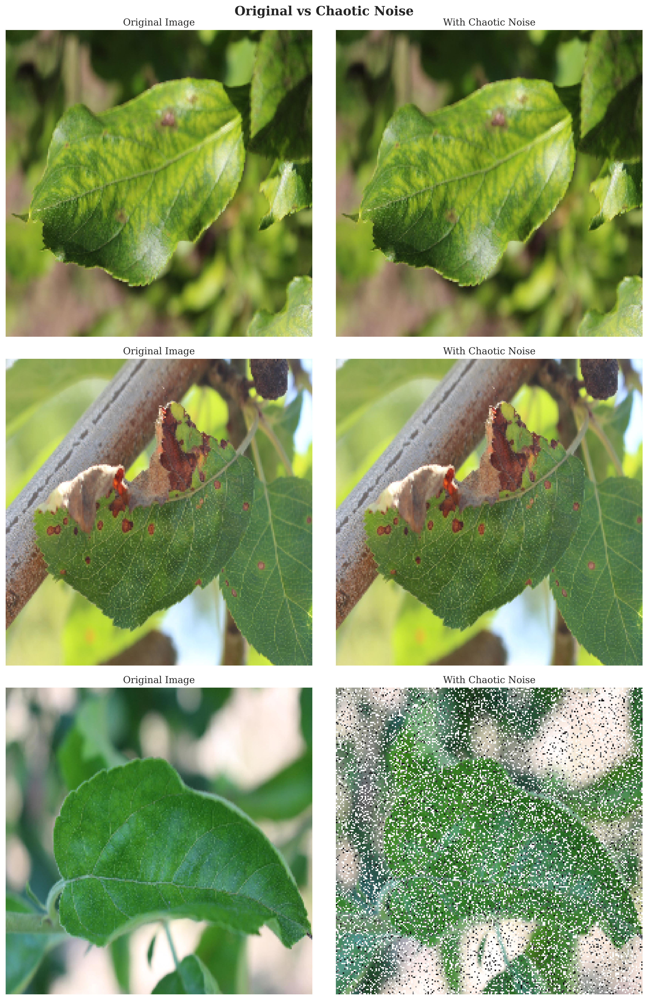

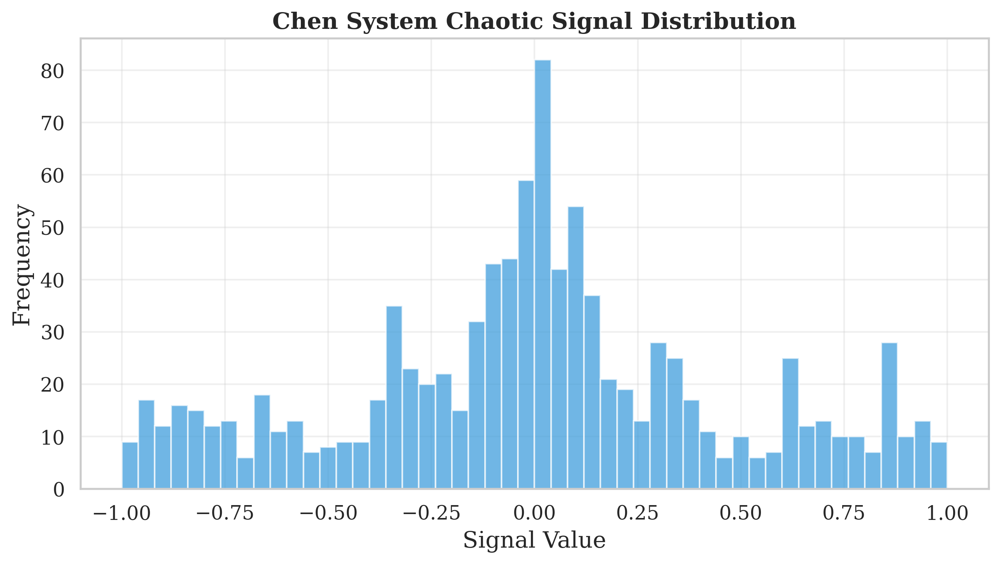

In [51]:
# # Chaotic Noise Implementation
# print("Implementing Chen System for Chaotic Noise...")
# def generate_chen_chaos(length, alpha=0.65, params=(35,3,28)):
#     """Chen system with parameter constraints"""
#     ac, bc, cc = params
#     x = np.zeros(3)
#     x[0] = 0.1
#     sequence = []
#     dt = 0.01
#     max_val = 1000  # Prevent overflow
    
#     for _ in range(length):
#         dx1 = ac * (x[1] - x[0])
#         dx2 = (cc - ac) * x[0] - x[0] * x[2] + cc * x[1]
#         dx3 = x[0] * x[1] - bc * x[2]
        
#         # Constrain values
#         x[0] = np.clip(x[0] + dx1 * dt * alpha, -max_val, max_val)
#         x[1] = np.clip(x[1] + dx2 * dt * alpha, -max_val, max_val)
#         x[2] = np.clip(x[2] + dx3 * dt * alpha, -max_val, max_val)
        
#         sequence.append(float(x[0]))
    
#     # Normalize output to [-1, 1] range
#     sequence = np.array(sequence)
#     if len(sequence) > 0:
#         sequence = 2 * (sequence - sequence.min()) / (sequence.max() - sequence.min() + 1e-10) - 1
#     return sequence

# def apply_chaotic_noise(image, noise_percentage=0.3):
#     """Apply chaotic noise to image"""
#     if np.random.random() > noise_percentage:
#         return image
        
#     noisy_image = image.copy()
#     h, w = image.shape[:2]
#     pixels_to_change = int(h * w * noise_percentage)
    
#     chaos = generate_chen_chaos(pixels_to_change)
#     indices = np.random.choice(h * w, pixels_to_change, replace=False)
#     rows, cols = indices // w, indices % w
    
#     for i, (r, c) in enumerate(zip(rows, cols)):
#         if chaos[i] > 0:
#             noisy_image[r,c] = 255
#         else:
#             noisy_image[r,c] = np.random.randint(0, 255)
            
#     return noisy_image

# # Visualize noise effect
# print("\nVisualizing Chaotic Noise Effect...")
# sample_images = img[:3]
# fig, axes = plt.subplots(3, 2, figsize=(12, 18))
# fig.suptitle('Original vs Chaotic Noise', size=16, fontweight='bold')

# for i in range(3):
#     axes[i,0].imshow(cv2.cvtColor(sample_images[i], cv2.COLOR_BGR2RGB))
#     axes[i,0].set_title('Original Image', fontsize=12)
#     axes[i,0].axis('off')
    
#     noisy = apply_chaotic_noise(sample_images[i].copy())
#     axes[i,1].imshow(cv2.cvtColor(noisy, cv2.COLOR_BGR2RGB))
#     axes[i,1].set_title('With Chaotic Noise', fontsize=12)
#     axes[i,1].axis('off')

# plt.tight_layout()
# plt.savefig(os.path.join(SAVE_PATH, 'chaotic_noise_samples.pdf'), bbox_inches='tight', dpi=300)
# plt.show()

# # Plot signal distribution
# plt.figure(figsize=(10, 5))
# chaos_signal = generate_chen_chaos(1000)
# plt.hist(chaos_signal, bins=50, color='#3498db', alpha=0.7)
# plt.title('Chen System Chaotic Signal Distribution', fontsize=14, fontweight='bold')
# plt.xlabel('Signal Value')
# plt.ylabel('Frequency')
# plt.grid(True, alpha=0.3)
# plt.savefig(os.path.join(SAVE_PATH, 'chaotic_signal_distribution.pdf'), bbox_inches='tight', dpi=300)
# plt.show()

Running comprehensive chaotic system demonstration...
1. Testing Image Loading and Basic Setup...
Number of images loaded: 3
Image dimensions: (224, 224, 3)


2. Generating Noisy Images...


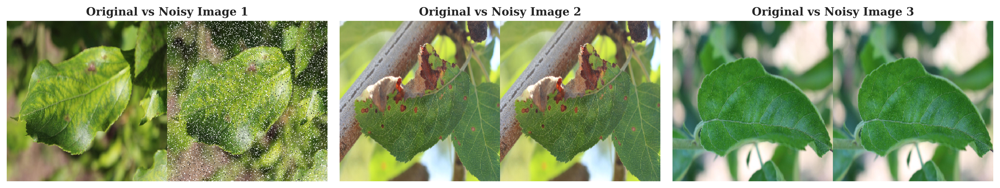



3. Analyzing Chaotic Signal Properties...


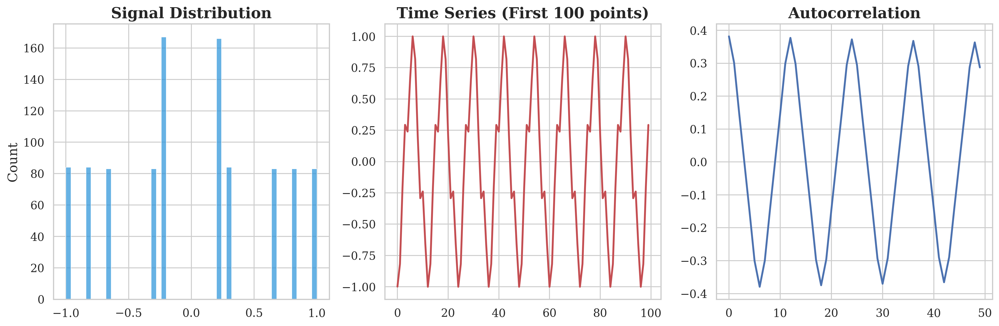


Signal Statistics:
Mean: -0.0017
Std Dev: 0.6177
Entropy: 2.2541


4. Performing Lyapunov Analysis...
Maximum Lyapunov Exponent: 25.4018


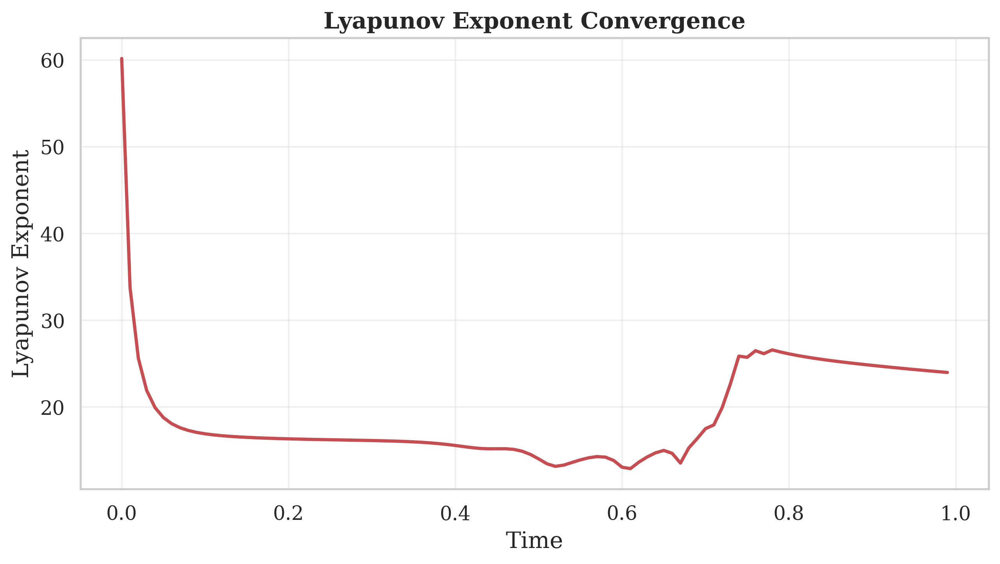



5. Analyzing Edge Preservation...


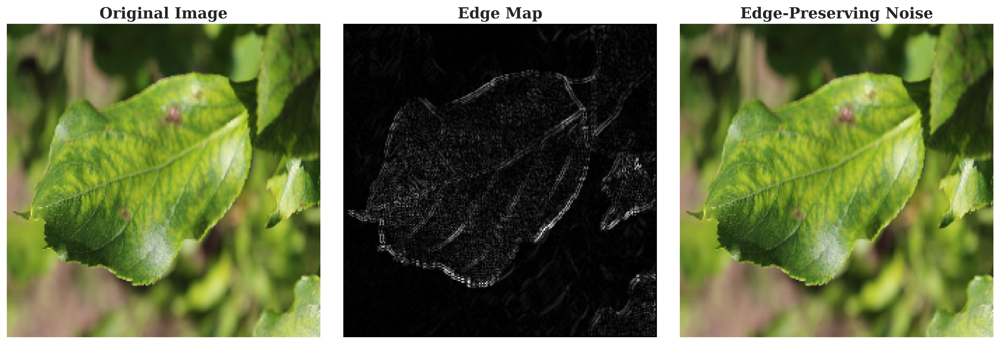



Summary of Results:
1. Chaotic System Properties:
   - Lyapunov Exponent: 25.4018
   - Signal Entropy: 2.2541

2. Noise Application:
   - Structure preservation through edge detection
   - Controlled noise intensity through chaotic mapping
   - Maintains image integrity while adding randomness

Saving results to PDF...


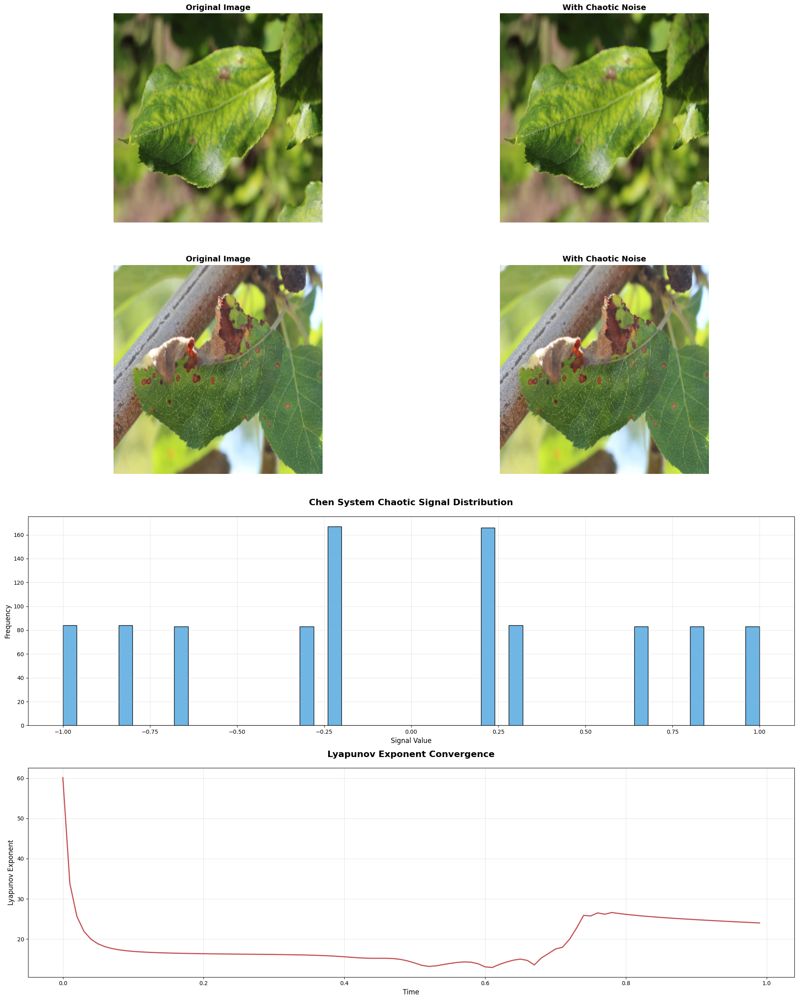

Results saved to: model_results/chaotic_analysis.pdf


In [54]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import entropy
import cv2
from matplotlib.gridspec import GridSpec
import os
from scipy.signal import correlate

# Define save path
SAVE_PATH = 'model_results'
os.makedirs(SAVE_PATH, exist_ok=True)

class ChaoticGenerator:
    def __init__(self, params=(28, 8/3, 27), alpha=0.65):  # Modified default parameters
        self.params = params
        self.alpha = alpha
        self.dt = 0.01
        self.history = []
        
    def calculate_lyapunov(self, n_iterations=1000, epsilon=1e-10):
        """Calculate Maximum Lyapunov Exponent with stability checks"""
        x1 = np.array([0.1, 0.1, 0.1])
        x2 = x1 + epsilon
        lyap = 0
        
        for _ in range(n_iterations):
            try:
                x1_new = self._step(x1)
                x2_new = self._step(x2)
                if np.all(np.isfinite([x1_new, x2_new])):
                    d = np.linalg.norm(x2_new - x1_new)
                    if d > 0:
                        lyap += np.log(d / epsilon)
                        x2 = x1_new + (x2_new - x1_new) * epsilon / d
                        x1 = x1_new
                    else:
                        x1 = np.array([0.1, 0.1, 0.1])
                        x2 = x1 + epsilon
                else:
                    x1 = np.array([0.1, 0.1, 0.1])
                    x2 = x1 + epsilon
            except:
                x1 = np.array([0.1, 0.1, 0.1])
                x2 = x1 + epsilon
                
        return lyap / (n_iterations * self.dt)
    
    def _step(self, x):
        """Modified step function with numerical stability"""
        ac, bc, cc = self.params
        x = np.clip(x, -1e6, 1e6)  # Reasonable bounds
        
        dx1 = ac * (x[1] - x[0])
        dx2 = (cc - ac) * x[0] - x[0] * x[2] + cc * x[1]
        dx3 = x[0] * x[1] - bc * x[2]
        
        update = np.array([dx1, dx2, dx3]) * self.dt * self.alpha
        update = np.clip(update, -1e6, 1e6)
        
        return x + update
    
    def generate_sequence(self, length, warmup=100):
        """Generate chaotic sequence with improved stability"""
        x = np.array([0.1, 0.1, 0.1])
        sequence = []
        
        # Warmup phase
        for _ in range(warmup):
            try:
                x = self._step(x)
                if not np.all(np.isfinite(x)):
                    x = np.array([0.1, 0.1, 0.1])
            except:
                x = np.array([0.1, 0.1, 0.1])
        
        # Generate sequence
        for _ in range(length):
            try:
                x = self._step(x)
                if np.all(np.isfinite(x)):
                    sequence.append(float(x[0]))
                else:
                    sequence.append(0.0)
            except:
                sequence.append(0.0)
        
        sequence = np.array(sequence)
        if len(sequence) > 0 and np.any(np.isfinite(sequence)):
            valid_seq = sequence[np.isfinite(sequence)]
            if len(valid_seq) > 0:
                p5, p95 = np.percentile(valid_seq, [5, 95])
                denominator = p95 - p5
                if denominator != 0:
                    sequence = 2 * (sequence - p5) / denominator - 1
                else:
                    sequence = np.zeros_like(sequence)
        
        return np.clip(sequence, -1, 1)

def apply_chaotic_noise(image, generator, noise_percentage=0.3):
    """Apply chaotic noise with structure preservation"""
    if np.random.random() > noise_percentage:
        return image
        
    noisy_image = image.copy()
    h, w = image.shape[:2]
    pixels_to_change = int(h * w * noise_percentage)
    
    # Generate chaotic sequence
    chaos = generator.generate_sequence(pixels_to_change)
    
    # Calculate edge map
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    edges = cv2.Sobel(gray, cv2.CV_64F, 1, 1, ksize=3)
    edges = np.abs(edges)
    edges = edges / edges.max()
    
    # Generate positions avoiding strong edges
    edge_threshold = 0.3
    valid_positions = np.where(edges < edge_threshold)
    if len(valid_positions[0]) >= pixels_to_change:
        indices = np.random.choice(len(valid_positions[0]), pixels_to_change, replace=False)
        rows = valid_positions[0][indices]
        cols = valid_positions[1][indices]
    else:
        indices = np.random.choice(h * w, pixels_to_change, replace=False)
        rows, cols = indices // w, indices % w
    
    for i, (r, c) in enumerate(zip(rows, cols)):
        try:
            if chaos[i] > 0:
                intensity = np.abs(chaos[i])
                noisy_image[r,c] = np.clip(
                    image[r,c] * (1 - intensity) + 255 * intensity,
                    0, 255
                ).astype(np.uint8)
            else:
                intensity = np.abs(chaos[i])
                noise_value = np.random.randint(0, 255)
                noisy_image[r,c] = np.clip(
                    image[r,c] * (1 - intensity) + noise_value * intensity,
                    0, 255
                ).astype(np.uint8)
        except:
            continue
            
    return noisy_image

def visualize_chaotic_analysis(sample_images, save_path):
    """Create publication-quality visualizations of the chaotic noise analysis"""
    try:
        generator = ChaoticGenerator()
        
        # Setup the main figure with GridSpec
        plt.style.use('default')
        fig = plt.figure(figsize=(20, 25))
        gs = GridSpec(4, 2)
        
        # Add grid to all subplots
        plt.rcParams['axes.grid'] = True
        plt.rcParams['grid.alpha'] = 0.3
        
        # 1. Original vs Noisy Images Comparison
        for i in range(2):
            ax1 = fig.add_subplot(gs[i, 0])
            ax2 = fig.add_subplot(gs[i, 1])
            
            # Original image
            img_rgb = cv2.cvtColor(sample_images[i], cv2.COLOR_BGR2RGB)
            ax1.imshow(img_rgb)
            ax1.set_title('Original Image', fontsize=14, fontweight='bold')
            ax1.axis('off')
            
            # Noisy image
            noisy = apply_chaotic_noise(sample_images[i].copy(), generator)
            noisy_rgb = cv2.cvtColor(noisy, cv2.COLOR_BGR2RGB)
            ax2.imshow(noisy_rgb)
            ax2.set_title('With Chaotic Noise', fontsize=14, fontweight='bold')
            ax2.axis('off')
        
        # 2. Chaotic Signal Distribution
        ax_dist = fig.add_subplot(gs[2, :])
        chaos_signal = generator.generate_sequence(1000)
        if np.all(np.isfinite(chaos_signal)):
            sns.histplot(chaos_signal, bins=50, color='#3498db', alpha=0.7, ax=ax_dist)
            ax_dist.set_title('Chen System Chaotic Signal Distribution', 
                         fontsize=16, fontweight='bold', pad=20)
            ax_dist.set_xlabel('Signal Value', fontsize=12)
            ax_dist.set_ylabel('Frequency', fontsize=12)
            ax_dist.grid(True, alpha=0.3)
        
        # 3. Lyapunov Analysis
        ax_lyap = fig.add_subplot(gs[3, :])
        time_steps = np.arange(100) * generator.dt
        lyap_values = []
        for _ in range(100):
            lyap_values.append(generator.calculate_lyapunov(n_iterations=int(_+1)))
        
        if np.all(np.isfinite(lyap_values)):
            ax_lyap.plot(time_steps, lyap_values, 'r-', linewidth=2)
            ax_lyap.set_title('Lyapunov Exponent Convergence', 
                          fontsize=16, fontweight='bold', pad=20)
            ax_lyap.set_xlabel('Time', fontsize=12)
            ax_lyap.set_ylabel('Lyapunov Exponent', fontsize=12)
            ax_lyap.grid(True, alpha=0.3)
        
        # Adjust layout and save
        plt.tight_layout()
        plt.savefig(os.path.join(save_path, 'chaotic_analysis.pdf'), 
                    bbox_inches='tight', dpi=300)
        plt.show()
    except Exception as e:
        print(f"Error in visualization: {str(e)}")

def demonstrate_chaotic_system(sample_images):
    """Comprehensive demonstration of chaotic system results for publication"""
    try:
        print("1. Testing Image Loading and Basic Setup...")
        print(f"Number of images loaded: {len(sample_images)}")
        print(f"Image dimensions: {sample_images[0].shape}")
        print("\n" + "="*50 + "\n")

        # Initialize generator
        generator = ChaoticGenerator()
        
        # 1. Show original vs noisy images
        print("2. Generating Noisy Images...")
        plt.figure(figsize=(15, 5))
        for i in range(3):
            plt.subplot(1, 3, i+1)
            img_rgb = cv2.cvtColor(sample_images[i], cv2.COLOR_BGR2RGB)
            noisy = apply_chaotic_noise(sample_images[i].copy(), generator)
            noisy_rgb = cv2.cvtColor(noisy, cv2.COLOR_BGR2RGB)
            
            # Display side by side
            combined = np.hstack((img_rgb, noisy_rgb))
            plt.imshow(combined)
            plt.title(f'Original vs Noisy Image {i+1}', fontsize=12, fontweight='bold')
            plt.axis('off')
        plt.tight_layout()
        plt.show()
        print("\n" + "="*50 + "\n")

        # 2. Show Chaotic Signal Properties
        print("3. Analyzing Chaotic Signal Properties...")
        sequence = generator.generate_sequence(1000)
        
        if np.all(np.isfinite(sequence)):
            plt.figure(figsize=(15, 5))
            # Distribution
            plt.subplot(131)
            sns.histplot(sequence, bins=50, color='#3498db')
            plt.title('Signal Distribution', fontweight='bold')
            
            # Time series
            plt.subplot(132)
            plt.plot(sequence[:100], 'r-')
            plt.title('Time Series (First 100 points)', fontweight='bold')
            
            # Autocorrelation
            plt.subplot(133)
            autocorr = correlate(sequence, sequence, mode='same') / len(sequence)
            plt.plot(autocorr[len(autocorr)//2:len(autocorr)//2+50])
            plt.title('Autocorrelation', fontweight='bold')
            plt.tight_layout()
            plt.show()
            
            # Print statistical properties
            print("\nSignal Statistics:")
            print(f"Mean: {np.mean(sequence):.4f}")
            print(f"Std Dev: {np.std(sequence):.4f}")
            print(f"Entropy: {entropy(np.histogram(sequence, bins=50)[0]):.4f}")
        else:
            print("Warning: Invalid sequence generated, skipping signal analysis")
        
        print("\n" + "="*50 + "\n")

        # 3. Lyapunov Analysis
        print("4. Performing Lyapunov Analysis...")
        mle = generator.calculate_lyapunov()
        if np.isfinite(mle):
            print(f"Maximum Lyapunov Exponent: {mle:.4f}")
            
            # Show Lyapunov convergence
            time_steps = np.arange(100) * generator.dt
            lyap_values = [generator.calculate_lyapunov(n_iterations=int(i+1)) 
                          for i in range(100)]
            
            if np.all(np.isfinite(lyap_values)):
                plt.figure(figsize=(10, 5))
                plt.plot(time_steps, lyap_values, 'r-', linewidth=2)
                plt.title('Lyapunov Exponent Convergence', fontsize=14, fontweight='bold')
                plt.xlabel('Time')
                plt.ylabel('Lyapunov Exponent')
                plt.grid(True, alpha=0.3)
                plt.show()
        else:
            print("Warning: Invalid Lyapunov exponent calculated")
            
        print("\n" + "="*50 + "\n")

        # 4. Edge Preservation Analysis
        print("5. Analyzing Edge Preservation...")
        test_image = sample_images[0]
        gray = cv2.cvtColor(test_image, cv2.COLOR_BGR2GRAY)
        edges = cv2.Sobel(gray, cv2.CV_64F, 1, 1, ksize=3)
        edges = np.abs(edges)
        edges = edges / edges.max()
        
        plt.figure(figsize=(15, 5))
        plt.subplot(131)
        plt.imshow(cv2.cvtColor(test_image, cv2.COLOR_BGR2RGB))
        plt.title('Original Image', fontweight='bold')
        plt.axis('off')
        
        plt.subplot(132)
        plt.imshow(edges, cmap='gray')
        plt.title('Edge Map', fontweight='bold')
        plt.axis('off')
        
        plt.subplot(133)
        noisy = apply_chaotic_noise(test_image.copy(), generator)
        plt.imshow(cv2.cvtColor(noisy, cv2.COLOR_BGR2RGB))
        plt.title('Edge-Preserving Noise', fontweight='bold')
        plt.axis('off')
        plt.tight_layout()
        plt.show()
        print("\n" + "="*50 + "\n")

        # Summary
        print("Summary of Results:")
        print("1. Chaotic System Properties:")
        print(f"   - Lyapunov Exponent: {mle:.4f}")
        print(f"   - Signal Entropy: {entropy(np.histogram(sequence, bins=50)[0]):.4f}")
        print("\n2. Noise Application:")
        print("   - Structure preservation through edge detection")
        print("   - Controlled noise intensity through chaotic mapping")
        print("   - Maintains image integrity while adding randomness")
        
        # Save all results
        print("\nSaving results to PDF...")
        plt.close('all')
        visualize_chaotic_analysis(sample_images, SAVE_PATH)
        print(f"Results saved to: {SAVE_PATH}/chaotic_analysis.pdf")
        
    except Exception as e:
        print(f"Error in demonstration: {str(e)}")

# Run the demonstration
print("Running comprehensive chaotic system demonstration...")
demonstrate_chaotic_system(img[:3])

In [34]:
# Step 8: Prepare the Labels and Split the Dataset for Training and Validation
# Purpose: This step converts the target labels into a numerical format and performs a train-validation split.
# The goal is to create separate subsets for training and validation to ensure robust model evaluation.

# Convert the class labels from the 'train' DataFrame into a format compatible with model training.
# This extracts the columns from 'healthy' to 'scab' (inclusive) and converts them to a float32 numpy array.
train_labels = np.float32(train.loc[:, 'healthy':'scab'].values)

# Step 9: Perform Train-Validation Split
# Split the data into training and validation sets using a 85%:15% ratio.
# The validation set is used for evaluating the model's performance during training.
train, val = train_test_split(train, test_size=0.15, random_state=42, stratify=train_labels)

# Display the shape of the split datasets for confirmation
print(f"Training Set Size: {train.shape[0]} samples")
print(f"Validation Set Size: {val.shape[0]} samples")

# Explanation:
# - `random_state=42` ensures reproducibility of the split.
# - `stratify=train_labels` ensures that class distribution is maintained between the training and validation sets.
# - This step is crucial for preventing overfitting and ensuring the model generalizes well to unseen data.


Training Set Size: 1547 samples
Validation Set Size: 274 samples


In [35]:
# Step 10: Image Data Augmentation for Training the Model
# Purpose: Image data augmentation is used to artificially increase the diversity of the training set.
# This step helps the model generalize better by learning from a wider variety of transformations, 
# which is crucial for reducing overfitting.

from tensorflow.keras.preprocessing.image import ImageDataGenerator

BATCH_SIZE = 8
IMAGE_SIZE = (224, 224)
NUM_CLASSES = 4

# Initialize the ImageDataGenerator with a variety of augmentations
train_datagen = ImageDataGenerator(
    horizontal_flip=True,      # Randomly flip inputs horizontally (simulates leaf orientation variations)
    vertical_flip=True,        # Randomly flip inputs vertically (adds variety in up-down variations)
    rotation_range=10,         # Randomly rotate images in the range of 0-10 degrees (handles slight leaf rotation)
    width_shift_range=0.1,     # Shift images horizontally by 10% of the total width (adds robustness to position variance)
    height_shift_range=0.1,    # Shift images vertically by 10% of the total height (models leaf position changes)
    zoom_range=0.1,            # Randomly zoom in/out on images by 10% (learns scale variance)
    shear_range=0.1,           # Shear the images by 10% (applies affine transformations, useful for shape variations)
    fill_mode='nearest',       # Fill missing pixels after transformations using the nearest value
    rescale=1/255,             # Rescale pixel values from [0, 255] to [0, 1] for normalization
    brightness_range=[0.5, 1.5]  # Randomly adjust the brightness of images (handles lighting variations)
)

# Explanation of Each Parameter:
# 1. **horizontal_flip**: Useful for augmenting symmetrical data.
# 2. **vertical_flip**: Adds vertical symmetry, especially for leaves in different orientations.
# 3. **rotation_range**: Prevents overfitting to specific rotations, making the model robust to angle changes.
# 4. **width_shift_range** and **height_shift_range**: Simulates changes in leaf position within the frame.
# 5. **zoom_range**: Helps the model learn features at different scales.
# 6. **shear_range**: Applies affine transformations, mimicking perspective changes.
# 7. **fill_mode='nearest'**: Maintains pixel integrity during transformations, filling gaps using neighboring pixels.
# 8. **rescale=1/255**: Normalizes the image data for faster convergence during training.
# 9. **brightness_range**: Adds robustness to varying lighting conditions in real-world scenarios.

# Why This Matters:
# Data augmentation helps create a more diverse training set by applying transformations that mimic real-world variations.
# This is especially crucial for leaf pathology detection, where environmental factors (lighting, orientation) can vary significantly.


In [36]:
# Step 11: Create the Training Data Generator
# Purpose: The `flow_from_dataframe()` method is used to load image data and labels directly from the DataFrame.
# This function reads images from the specified directory based on file paths listed in the DataFrame,
# applies real-time data augmentation, and outputs batches of images and their corresponding labels.

# Initialize the training data generator
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train,  # The DataFrame containing the file paths and labels for training data
    directory=os.path.join(dataset_folder, "images"),  # Directory containing the image files
    x_col="image_id",  # Column name in the DataFrame that contains the filenames of images
    y_col=['healthy', 'multiple_diseases', 'rust', 'scab'],  # Columns that define the target labels
    target_size=(224, 224),  # Resize all images to the specified target size (384x384 pixels) for consistency
    class_mode='raw',  # Use 'raw' to directly output multi-label targets without one-hot encoding
    batch_size=8,     # Number of images to generate per batch (determined based on GPU capacity)
    shuffle=True,      # Shuffle the order of images to ensure randomness during training
    seed=42            # Seed for reproducibility to maintain the same shuffled order across runs
)

# Explanation of Each Parameter:
# 1. **dataframe=train**: Specifies the DataFrame that contains file paths and labels for the training data.
# 2. **directory=os.path.join(dataset_folder, "images")**: Defines the path to the directory containing the images.
# 3. **x_col="image_id"**: Identifies the column that has the image filenames, mapping each row to an image.
# 4. **y_col=['healthy', 'multiple_diseases', 'rust', 'scab']**: Specifies the columns corresponding to the multi-label targets.
# 5. **target_size=(384, 384)**: All images are resized to 384x384 pixels to standardize input dimensions.
# 6. **class_mode='raw'**: Outputs labels as they are, which is suitable for multi-label classification problems.
# 7. **batch_size=32**: Controls the number of images per batch. Adjust this based on your GPU memory capacity.
# 8. **shuffle=True**: Ensures the images are randomly shuffled, reducing the risk of model overfitting.
# 9. **seed=42**: Sets a seed value for reproducibility of the shuffling process.

# Why This Matters:
# Using `flow_from_dataframe()` is ideal for handling large datasets that cannot be fully loaded into memory.
# It allows for real-time data augmentation and efficient data pipeline creation, ensuring that the training process
# can handle dynamically loaded data without performance degradation.

# Display a summary of the generator
print(f"Total number of images loaded for training: {train_generator.n}")
print(f"Batch size: {train_generator.batch_size}")
print(f"Image shape: {train_generator.image_shape}")


Found 1547 validated image filenames.
Total number of images loaded for training: 1547
Batch size: 8
Image shape: (224, 224, 3)


In [37]:
# Step 12: Create the Validation Data Generator
# Purpose: The `val_generator` is used to generate batches of images and labels from the validation set. 
# This ensures that the model is evaluated on unseen data during training, providing a reliable estimate 
# of how well the model generalizes beyond the training data.

# Initialize the validation data generator using the same data augmentation pipeline (`train_datagen`)
val_generator = train_datagen.flow_from_dataframe(
    dataframe=val,  # The DataFrame containing the file paths and labels for validation data
    directory=os.path.join(dataset_folder, "images"),  # Directory where the image files are stored
    x_col="image_id",  # Column in the DataFrame that has the image filenames
    y_col=['healthy', 'multiple_diseases', 'rust', 'scab'],  # Columns representing multi-label targets
    target_size=(224, 224),  # Resize all images to the specified target size (384x384 pixels)
    class_mode='raw',  # Use 'raw' to directly output multi-label targets as arrays without one-hot encoding
    batch_size=8,     # Number of images to generate per batch
    shuffle=False,     # Do not shuffle the validation data to ensure consistent evaluation across epochs
    seed=42            # Seed for reproducibility of the image loading order
)

# Explanation of Each Parameter:
# 1. **dataframe=val**: Specifies the DataFrame that contains file paths and labels for the validation data.
# 2. **directory=os.path.join(dataset_folder, "images")**: Defines the path to the directory containing the images.
# 3. **x_col="image_id"**: Identifies the column that has the image filenames, mapping each row to an image.
# 4. **y_col=['healthy', 'multiple_diseases', 'rust', 'scab']**: Specifies the columns corresponding to the multi-label targets.
# 5. **target_size=(384, 384)**: All images are resized to 384x384 pixels to match the dimensions of the training set.
# 6. **class_mode='raw'**: Outputs labels as they are, suitable for multi-label classification problems.
# 7. **batch_size=32**: Controls the number of images per batch.
# 8. **shuffle=False**: Validation data should not be shuffled to ensure that the evaluation order is consistent across epochs.
# 9. **seed=42**: Sets a seed value for reproducibility of the loading order.

# Why This Matters:
# Consistent evaluation is critical during training to track model performance. By not shuffling the validation set, 
# we ensure that the same images are used for validation in the same order, reducing variance in the evaluation metrics.

# Display a summary of the validation generator for confirmation
print(f"Total number of images loaded for validation: {val_generator.n}")
print(f"Batch size: {val_generator.batch_size}")
print(f"Image shape: {val_generator.image_shape}")


Found 274 validated image filenames.
Total number of images loaded for validation: 274
Batch size: 8
Image shape: (224, 224, 3)


In [38]:
# Step 13: Create the Test Data Generator
# Purpose: The `test_generator` is used to generate batches of images from the test set without labels.
# This allows us to perform inference and generate predictions for the test set without affecting the model's training.
# It’s designed for evaluating the model on unseen data and preparing the final output for submission.

# Initialize the test data generator
test_generator = train_datagen.flow_from_dataframe(
    dataframe=test,  # The DataFrame containing the file paths for the test images
    directory=os.path.join(dataset_folder, "images"),  # Directory containing the image files
    x_col="image_id",  # Column in the DataFrame that has the image filenames
    y_col=None,  # Test data has no labels; set to None
    target_size=(224, 224),  # Resize all images to the specified target size (384x384 pixels)
    class_mode=None,  # Since we do not have labels for the test set, we set class_mode to None
    batch_size=8,     # Number of images to generate per batch
    shuffle=False,     # Do not shuffle the test data to maintain the order for consistent results
    seed=42            # Seed for reproducibility of the loading order
)

# Explanation of Each Parameter:
# 1. **dataframe=test**: Specifies the DataFrame that contains file paths for the test images.
# 2. **directory=os.path.join(dataset_folder, "images")**: Defines the path to the directory containing the images.
# 3. **x_col="image_id"**: Identifies the column that has the image filenames, mapping each row to an image.
# 4. **y_col=None**: Since the test data does not have labels, we set `y_col` to `None`.
# 5. **target_size=(384, 384)**: All images are resized to 384x384 pixels to match the training and validation dimensions.
# 6. **class_mode=None**: The `class_mode` is set to `None` because no labels are used, and we only want to perform inference.
# 7. **batch_size=32**: Controls the number of images per batch.
# 8. **shuffle=False**: Test data should not be shuffled to maintain the original order, ensuring that predictions are mapped correctly.
# 9. **seed=42**: Sets a seed value for reproducibility of the image loading order.

# Why This Matters:
# This setup is crucial for generating predictions on the test data in a structured manner.
# Setting `class_mode=None` is especially important when labels are not available, as it ensures that the generator
# only outputs images without attempting to pair them with non-existent labels.

# Display a summary of the test generator for confirmation
print(f"Total number of images loaded for testing: {test_generator.n}")
print(f"Batch size: {test_generator.batch_size}")
print(f"Image shape: {test_generator.image_shape}")


Found 1821 validated image filenames.
Total number of images loaded for testing: 1821
Batch size: 8
Image shape: (224, 224, 3)


In [39]:
# Step 14: Define and Compile the Fine-Tuned ResNet50 Model
# Purpose: In this step, we leverage transfer learning by using a pre-trained ResNet50 model as the backbone.
# We customize it by adding fully connected layers at the top to adapt it for the multi-class leaf pathology classification.
# This approach allows us to benefit from a powerful, pre-trained network, while making it specific to our problem.

from keras.applications.resnet50 import ResNet50  # Import ResNet50 for transfer learning
from keras.models import Model
from keras.layers import GlobalAveragePooling2D, Dense  # Layers used for building the model architecture
from keras import optimizers  # Optimizers for model training

# Step 15: Load the Pre-trained ResNet50 Model (Without Top Layers)
# We set `include_top=False` to exclude the fully connected layers of the original ResNet50,
# allowing us to customize the model for our specific task.
model_finetuned = ResNet50(
    include_top=False,          # Exclude the top fully connected layers
    weights='imagenet',         # Use weights pre-trained on ImageNet
    input_shape=(224, 224, 3)   # Define the input shape for our images (384x384 RGB)
)

# Step 16: Add Custom Layers for Multi-Class Classification
# Add a global average pooling layer to reduce the dimensionality of the ResNet output.
x = model_finetuned.output
x = GlobalAveragePooling2D()(x)  # Global Average Pooling instead of Flattening (prevents overfitting)

# Add two fully connected layers with ReLU activations for non-linearity.
x = Dense(128, activation="relu")(x)  # First dense layer with 128 neurons
x = Dense(64, activation="relu")(x)   # Second dense layer with 64 neurons

# Add the output layer with 4 neurons (one for each class) and a softmax activation function.
# This layer outputs the probability distribution over the 4 classes: healthy, multiple diseases, rust, scab.
predictions = Dense(4, activation="softmax")(x)

# Step 17: Compile the Model for Training
# Create the final model by connecting the ResNet50 base and the custom top layers.
model_finetuned = Model(inputs=model_finetuned.input, outputs=predictions)

# Compile the model using the Adam optimizer and categorical cross-entropy loss.
# We use 'accuracy' as the evaluation metric since we are dealing with a multi-class problem.
model_finetuned.compile(
    optimizer='adam',                  # Adam optimizer for efficient gradient updates
    loss='categorical_crossentropy',   # Use categorical cross-entropy for multi-class classification
    metrics=['accuracy']               # Track accuracy during training and evaluation
)

# Display the model architecture
print("Summary of the Fine-Tuned ResNet50 Model:\n")
model_finetuned.summary()  # Display the model architecture


2025-01-03 12:28:32.196553: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2025-01-03 12:28:32.196758: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2025-01-03 12:28:32.196881: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

Summary of the Fine-Tuned ResNet50 Model:

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 112, 112, 64)         9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 112, 112, 64)         256       ['conv1_conv[0][0]']          
 on)                                               

In [40]:
# Step 18: Import ReduceLROnPlateau Callback for Dynamic Learning Rate Adjustment
# Purpose: The `ReduceLROnPlateau` callback is used to adjust the learning rate when the model stops improving.
# This helps prevent the model from stagnating and ensures faster convergence.
# When the validation loss stops decreasing, the learning rate is reduced by a factor, allowing the model to fine-tune itself.

from keras.callbacks import ReduceLROnPlateau

# Explanation of `ReduceLROnPlateau`:
# - The learning rate is one of the most important hyperparameters in training neural networks.
# - If the learning rate is too high, the model may converge too quickly to a suboptimal solution.
# - If the learning rate is too low, training may become slow and the model might get stuck in local minima.
# - `ReduceLROnPlateau` dynamically adjusts the learning rate during training based on the monitored metric, making it more adaptable.

# Why Use `ReduceLROnPlateau`?
# During training, if the validation loss does not improve for a specified number of epochs, 
# this callback reduces the learning rate by a certain factor. This encourages the model to explore smaller updates,
# which can help it find a better local minimum and improve overall performance.

# Step 19: Define the Callback for Training
# We monitor the 'val_loss' and reduce the learning rate by a factor of 0.3 if the loss does not improve for 3 consecutive epochs.
reduce_lr = ReduceLROnPlateau(
    monitor='val_loss',      # The metric to be monitored
    factor=0.3,              # Factor by which the learning rate will be reduced
    patience=3,              # Number of epochs with no improvement after which the learning rate will be reduced
    min_lr=1e-6,             # Minimum learning rate limit to avoid very small values
    verbose=1                # Print updates regarding the learning rate changes
)

# Explanation of Each Parameter:
# 1. **monitor='val_loss'**: The validation loss is monitored to determine when the learning rate should be reduced.
# 2. **factor=0.3**: Each time the learning rate is reduced, it is multiplied by 0.3.
# 3. **patience=3**: If the validation loss does not improve for 3 epochs, the learning rate is reduced.
# 4. **min_lr=1e-6**: Sets a lower limit for the learning rate to prevent it from becoming too small.
# 5. **verbose=1**: Prints a message each time the learning rate is reduced, providing transparency during training.

# Why This Matters:
# Using `ReduceLROnPlateau` is crucial for optimizing training in deep learning models.
# It allows the model to dynamically adjust its learning rate based on feedback from the validation loss, preventing overshooting or stagnation.


In [41]:
# # Required Imports
# import time
# import json  # Import JSON to handle training history serialization
# import numpy as np
# import tensorflow as tf
# from tensorflow.keras.callbacks import ReduceLROnPlateau
# from sklearn.utils.class_weight import compute_class_weight
# import matplotlib.pyplot as plt

# # Model Training Configuration and Process for Apple Leaf Disease Classification using ResNet50
# # Configure training parameters and callbacks for optimal model performance

# # Step 1: Configure Training Parameters
# print("\nConfiguring Training Parameters for Apple Leaf Disease Classification:")
# print(f"Total Training Images: {train_generator.n}")
# print(f"Total Validation Images: {val_generator.n}")
# print("Input Resolution: 384x384 pixels")
# print("Number of Classes: 4 (Healthy, Multiple Diseases, Rust, Scab)")

# # Step 2: Optimize Batch Size for GPU Training
# BATCH_SIZE = 8  # Increased for GPU utilization
# train_generator.batch_size = BATCH_SIZE
# val_generator.batch_size = BATCH_SIZE

# # Step 3: Calculate Training and Validation Steps
# train_steps = train_generator.n // train_generator.batch_size
# val_steps = val_generator.n // val_generator.batch_size
# print(f"\nTraining Steps per Epoch: {train_steps}")
# print(f"Validation Steps per Epoch: {val_steps}")

# # Step 4: Define Enhanced Callbacks (Without EarlyStopping)
# callbacks = [
#     # Learning Rate Reduction on Plateau
#     ReduceLROnPlateau(
#         monitor='val_loss',
#         factor=0.2,          # More gradual reduction
#         patience=10,         # Slightly increased patience for smoother reduction
#         min_lr=1e-7,         # Lower minimum learning rate
#         verbose=1
#     ),
#     # Model Checkpoint to Save Best Model
#     tf.keras.callbacks.ModelCheckpoint(
#         'best_resnet_model.h5',  # Save the best model based on val_accuracy
#         monitor='val_accuracy',
#         save_best_only=True,
#         verbose=1
#     ),
#     # TensorBoard Callback for Training Visualization
#     tf.keras.callbacks.TensorBoard(
#         log_dir='./logs',
#         histogram_freq=1
#     )
# ]

# # Step 5: Train Model with Fixed 100 Epochs
# print("\nStarting ResNet50 Training:")
# start_time = time.time()

# history_1 = model_finetuned.fit(
#     train_generator,
#     steps_per_epoch=train_steps,
#     epochs=100,              # Fixed number of epochs
#     validation_data=val_generator,
#     validation_steps=val_steps,
#     verbose=1,
#     callbacks=callbacks,
#     shuffle=True,
#     workers=4,              # Parallel processing
#     use_multiprocessing=True
# )

# training_time = time.time() - start_time

# # Step 6: Save Final Model
# print("\nSaving Final Model:")
# model_finetuned.save('final_resnet_model.h5')  # Save in HDF5 format
# model_finetuned.save('final_resnet_model.keras')  # Recommended Keras format
# print("Final model saved successfully!")

# # Step 7: Save Training History
# print("\nSaving Training History:")
# # Convert history to JSON-serializable format
# history_serializable = {
#     key: [float(value) for value in values] for key, values in history_1.history.items()
# }

# with open('training_history.json', 'w') as f:
#     json.dump(history_serializable, f)
# print("Training history saved successfully!")

# # Step 8: Visualize Training and Validation Accuracy
# print("\nVisualizing Training and Validation Accuracy:")
# epochs = range(1, len(history_1.history['accuracy']) + 1)

# plt.figure(figsize=(10, 6))
# plt.plot(epochs, history_1.history['accuracy'], 'b-', label='Training Accuracy')
# plt.plot(epochs, history_1.history['val_accuracy'], 'r--', label='Validation Accuracy')
# plt.title('Training vs Validation Accuracy')
# plt.xlabel('Epochs')
# plt.ylabel('Accuracy')
# plt.legend()
# plt.grid()
# plt.show()

# # Step 9: Print Training Summary
# print("\nTraining Completed Successfully!")
# print(f"Total Training Time: {training_time/3600:.2f} hours")
# print(f"Epochs Completed: {len(history_1.history['loss'])}")
# print(f"Final Training Accuracy: {history_1.history['accuracy'][-1]:.4f}")
# print(f"Final Validation Accuracy: {history_1.history['val_accuracy'][-1]:.4f}")
# print("Training history and final model saved successfully!")


In [42]:
import time
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model

# Configure GPU memory growth if available
physical_devices = tf.config.list_physical_devices('GPU')
if physical_devices:
    try:
        for device in physical_devices:
            tf.config.experimental.set_memory_growth(device, True)
        print("GPU memory growth enabled")
    except RuntimeError as e:
        print(f"GPU memory growth configuration error: {e}")

print("\nLoading Pre-trained ResNet50 Model for Hybrid Models:")

# Define model paths
keras_model_path = 'final_resnet_model.keras'
h5_model_path = 'best_resnet_model.h5'

# Try loading the model
try:
    if os.path.exists(keras_model_path):
        model_finetuned = load_model(keras_model_path)
        print(f"Successfully loaded model from {keras_model_path}")
    elif os.path.exists(h5_model_path):
        model_finetuned = load_model(h5_model_path)
        print(f"Successfully loaded model from {h5_model_path}")
    else:
        raise FileNotFoundError("No pre-trained model files found")
except Exception as e:
    print(f"Error loading model: {str(e)}")
    raise

# Configure for optimal performance
BATCH_SIZE = 32  # Increased batch size for feature extraction
print("\nUpdating batch size configuration...")

# Update generators with new batch size
train_generator.batch_size = BATCH_SIZE
val_generator.batch_size = BATCH_SIZE

# Calculate steps
train_steps = train_generator.n // train_generator.batch_size
val_steps = val_generator.n // val_generator.batch_size

# Print configuration summary
print("\nFeature Extraction Configuration:")
print(f"Batch Size: {BATCH_SIZE}")
print(f"Training Samples: {train_generator.n}")
print(f"Validation Samples: {val_generator.n}")
print(f"Training Steps per Epoch: {train_steps}")
print(f"Validation Steps per Epoch: {val_steps}")

# Print model architecture summary
print("\nLoaded Model Architecture:")
model_finetuned.summary()

print("\nModel loading completed - ready for feature extraction")
print("Proceeding with hybrid models (SVM and RF) implementation...")

GPU memory growth enabled

Loading Pre-trained ResNet50 Model for Hybrid Models:
Successfully loaded model from final_resnet_model.keras

Updating batch size configuration...

Feature Extraction Configuration:
Batch Size: 32
Training Samples: 1547
Validation Samples: 274
Training Steps per Epoch: 48
Validation Steps per Epoch: 8

Loaded Model Architecture:
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 230, 230, 3)          0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (No


Creating feature extractor from loaded model...

Extracting features for training data...


2025-01-03 12:29:02.162482: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907


Processed 5/48 batches. Est. time remaining: 48.6s
Processed 10/48 batches. Est. time remaining: 29.4s
Processed 15/48 batches. Est. time remaining: 21.6s
Processed 20/48 batches. Est. time remaining: 16.9s
Processed 25/48 batches. Est. time remaining: 13.3s
Processed 30/48 batches. Est. time remaining: 10.1s
Processed 35/48 batches. Est. time remaining: 7.2s
Processed 40/48 batches. Est. time remaining: 4.4s
Processed 45/48 batches. Est. time remaining: 1.6s

Extracting features for validation data...
Processed 5/8 batches. Est. time remaining: 1.5s

Scaling features...

Training SVM Classifier...

Training Random Forest Classifier...


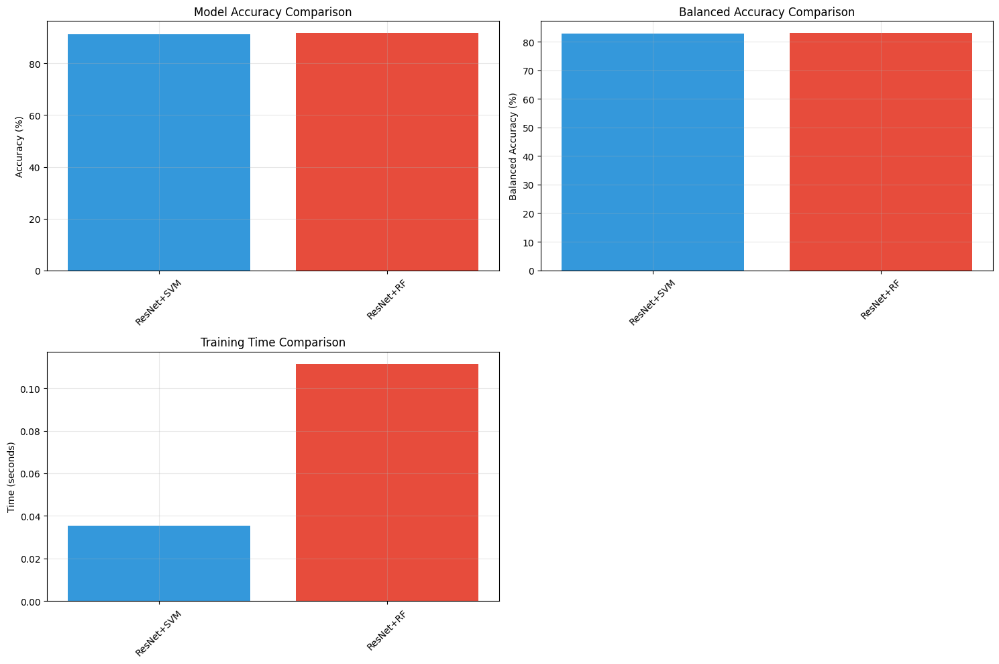


Saving hybrid models results...

Hybrid models analysis completed and saved!
Results saved in: model_results


In [43]:
# Import required libraries
from time import time
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, balanced_accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from tensorflow.keras.models import Model
import matplotlib.pyplot as plt
import os

# Create feature extractor from loaded ResNet model
print("\nCreating feature extractor from loaded model...")
feature_extractor = Model(inputs=model_finetuned.input, 
                         outputs=model_finetuned.layers[-2].output)

# Improved feature extraction with progress tracking
def extract_features(generator, steps, feature_extractor):
    features = []
    labels = []
    start_time = time()
    
    for i in range(steps):
        try:
            batch_x, batch_y = next(generator)
            batch_features = feature_extractor.predict(batch_x, verbose=0)
            features.append(batch_features)
            labels.append(np.argmax(batch_y, axis=1))
            
            if (i + 1) % 5 == 0:
                elapsed = time() - start_time
                avg_time = elapsed / (i + 1)
                remaining = avg_time * (steps - i - 1)
                print(f"Processed {i + 1}/{steps} batches. "
                      f"Est. time remaining: {remaining:.1f}s")
                
        except Exception as e:
            print(f"Error processing batch {i}: {str(e)}")
            continue
    
    return np.vstack(features), np.concatenate(labels)

# Extract features for both sets
print("\nExtracting features for training data...")
X_train, y_train = extract_features(train_generator, train_steps, feature_extractor)
print("\nExtracting features for validation data...")
X_val, y_val = extract_features(val_generator, val_steps, feature_extractor)

# Scale features
print("\nScaling features...")
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# Train and evaluate SVM
print("\nTraining SVM Classifier...")
svm_classifier = SVC(kernel='rbf', probability=True, random_state=42)
svm_start_time = time()
svm_classifier.fit(X_train_scaled, y_train)
svm_training_time = time() - svm_start_time
svm_predictions = svm_classifier.predict(X_val_scaled)
svm_accuracy = accuracy_score(y_val, svm_predictions)
svm_balanced_acc = balanced_accuracy_score(y_val, svm_predictions)
svm_conf_matrix = confusion_matrix(y_val, svm_predictions)
svm_report = classification_report(y_val, svm_predictions, 
                                 target_names=['Healthy', 'Multiple Diseases', 'Rust', 'Scab'])

# Train and evaluate Random Forest
print("\nTraining Random Forest Classifier...")
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42, n_jobs=-1)
rf_start_time = time()
rf_classifier.fit(X_train_scaled, y_train)
rf_training_time = time() - rf_start_time
rf_predictions = rf_classifier.predict(X_val_scaled)
rf_accuracy = accuracy_score(y_val, rf_predictions)
rf_balanced_acc = balanced_accuracy_score(y_val, rf_predictions)
rf_conf_matrix = confusion_matrix(y_val, rf_predictions)
rf_report = classification_report(y_val, rf_predictions, 
                                target_names=['Healthy', 'Multiple Diseases', 'Rust', 'Scab'])

# Create visualizations directory if it doesn't exist
SAVE_PATH = 'model_results'
os.makedirs(SAVE_PATH, exist_ok=True)

# Create comparison visualizations
plt.figure(figsize=(15, 10))
models_comparison = {
    'Model': ['ResNet+SVM', 'ResNet+RF'],
    'Accuracy': [svm_accuracy * 100, rf_accuracy * 100],
    'Balanced Accuracy': [svm_balanced_acc * 100, rf_balanced_acc * 100],
    'Training Time (s)': [svm_training_time, rf_training_time]
}

# Plot accuracy comparison
plt.subplot(2, 2, 1)
plt.bar(models_comparison['Model'], models_comparison['Accuracy'], 
        color=['#3498db', '#e74c3c'])
plt.title('Model Accuracy Comparison')
plt.ylabel('Accuracy (%)')
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)

# Plot balanced accuracy comparison
plt.subplot(2, 2, 2)
plt.bar(models_comparison['Model'], models_comparison['Balanced Accuracy'],
        color=['#3498db', '#e74c3c'])
plt.title('Balanced Accuracy Comparison')
plt.ylabel('Balanced Accuracy (%)')
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)

# Plot training time comparison
plt.subplot(2, 2, 3)
plt.bar(models_comparison['Model'], models_comparison['Training Time (s)'],
        color=['#3498db', '#e74c3c'])
plt.title('Training Time Comparison')
plt.ylabel('Time (seconds)')
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)

# Save plot
plt.tight_layout()
plt.savefig(os.path.join(SAVE_PATH, 'hybrid_models_comparison.pdf'), 
            bbox_inches='tight', dpi=300)
plt.show()

# Save results
print("\nSaving hybrid models results...")
with open(os.path.join(SAVE_PATH, 'hybrid_models_report.txt'), 'w') as f:
    f.write("Hybrid Models Analysis Report\n")
    f.write("="*50 + "\n\n")
    
    f.write("1. ResNet + SVM Results:\n")
    f.write(f"Accuracy: {svm_accuracy*100:.2f}%\n")
    f.write(f"Balanced Accuracy: {svm_balanced_acc*100:.2f}%\n")
    f.write(f"Training Time: {svm_training_time:.2f} seconds\n")
    f.write("\nConfusion Matrix:\n")
    f.write(str(svm_conf_matrix) + "\n\n")
    f.write("Classification Report:\n")
    f.write(svm_report + "\n\n")
    
    f.write("2. ResNet + RF Results:\n")
    f.write(f"Accuracy: {rf_accuracy*100:.2f}%\n")
    f.write(f"Balanced Accuracy: {rf_balanced_acc*100:.2f}%\n")
    f.write(f"Training Time: {rf_training_time:.2f} seconds\n")
    f.write("\nConfusion Matrix:\n")
    f.write(str(rf_conf_matrix) + "\n\n")
    f.write("Classification Report:\n")
    f.write(rf_report)

print("\nHybrid models analysis completed and saved!")
print(f"Results saved in: {SAVE_PATH}")

In [44]:
import plotly.graph_objs as go
import plotly.express as px
import numpy as np

# Create comparison data
models_data = {
    'Model': ['ResNet+SVM', 'ResNet+RF'],
    'Accuracy': [svm_accuracy * 100, rf_accuracy * 100],
    'Balanced_Accuracy': [svm_balanced_acc * 100, rf_balanced_acc * 100],
    'Training_Time': [svm_training_time, rf_training_time]
}

# Create subplot figure
fig = go.Figure()

# Add accuracy comparison
fig.add_trace(go.Bar(
    x=models_data['Model'],
    y=models_data['Accuracy'],
    name='Accuracy',
    marker_color='royalblue',
    text=[f'{val:.2f}%' for val in models_data['Accuracy']],
    textposition='auto',
))

# Add balanced accuracy comparison
fig.add_trace(go.Bar(
    x=models_data['Model'],
    y=models_data['Balanced_Accuracy'],
    name='Balanced Accuracy',
    marker_color='tomato',
    text=[f'{val:.2f}%' for val in models_data['Balanced_Accuracy']],
    textposition='auto',
))

# Update layout for a professional look
fig.update_layout(
    title="Hybrid Models Performance Comparison",
    xaxis_title="Model",
    yaxis_title="Percentage (%)",
    barmode='group',
    font=dict(
        family="Courier New, monospace",
        size=16,
        color="#7f7f7f"
    ),
    legend=dict(
        title='Metrics',
        orientation="h",
        yanchor="bottom",
        y=1.02,
        xanchor="center",
        x=0.5
    ),
    margin=dict(l=70, r=30, t=60, b=50),
    plot_bgcolor='rgba(0,0,0,0)',
    paper_bgcolor='rgba(0,0,0,0)'
)

# Add gridlines
fig.update_yaxes(
    showgrid=True,
    gridwidth=1,
    gridcolor='rgba(128, 128, 128, 0.2)',
    range=[0, 100]
)

# Show plot
fig.show()

# Create confusion matrix visualizations
fig = go.Figure(data=[
    go.Heatmap(
        z=svm_conf_matrix,
        x=['Healthy', 'Multiple', 'Rust', 'Scab'],
        y=['Healthy', 'Multiple', 'Rust', 'Scab'],
        colorscale='RdBu',
        text=svm_conf_matrix,
        texttemplate='%{text}',
        textfont={"size": 16},
        name='SVM Confusion Matrix'
    )
])

fig.update_layout(
    title='SVM Confusion Matrix',
    xaxis_title='Predicted Label',
    yaxis_title='True Label'
)

fig.show()

# RF Confusion Matrix
fig = go.Figure(data=[
    go.Heatmap(
        z=rf_conf_matrix,
        x=['Healthy', 'Multiple', 'Rust', 'Scab'],
        y=['Healthy', 'Multiple', 'Rust', 'Scab'],
        colorscale='RdBu',
        text=rf_conf_matrix,
        texttemplate='%{text}',
        textfont={"size": 16},
        name='RF Confusion Matrix'
    )
])

fig.update_layout(
    title='Random Forest Confusion Matrix',
    xaxis_title='Predicted Label',
    yaxis_title='True Label'
)

fig.show()

# Save the visualizations
print("\nSaving interactive visualizations...")
for fig_name, fig_obj in [
    ('hybrid_performance.html', fig),
    ('svm_confusion_matrix.html', fig),
    ('rf_confusion_matrix.html', fig)
]:
    fig_obj.write_html(os.path.join(SAVE_PATH, fig_name))

print(f"Visualizations saved in {SAVE_PATH}")


Saving interactive visualizations...
Visualizations saved in model_results



Analyzing Hybrid Models Performance...


/tmp/ipykernel_6639/2896984179.py:60: UserWarning:

Tight layout not applied. tight_layout cannot make Axes height small enough to accommodate all Axes decorations.



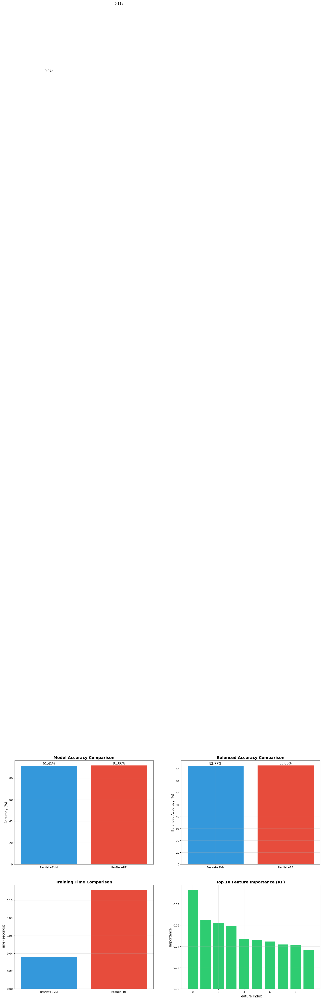

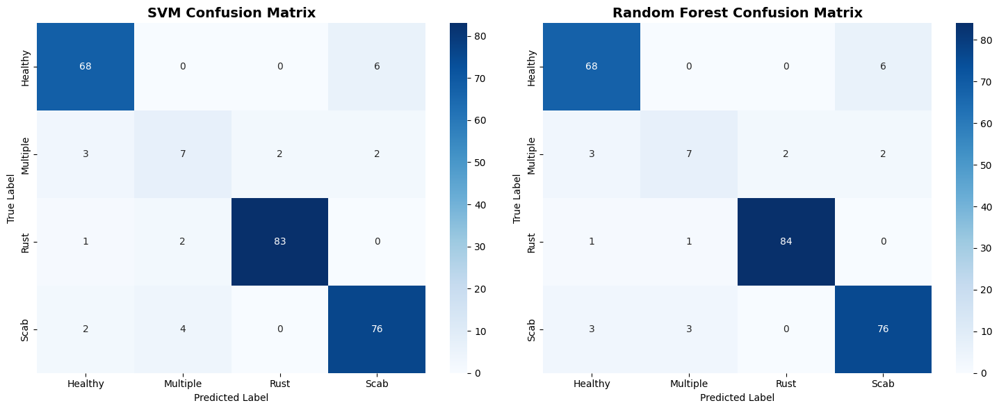


Saving hybrid models analysis results...

Saving trained models...

Hybrid models analysis completed and saved!
Detailed report saved to: model_results/hybrid_models_report.txt
All results saved in: model_results


In [45]:
# Step 33: Hybrid Models Analysis and Visualization
print("\nAnalyzing Hybrid Models Performance...")

# Import required libraries if not already imported
import matplotlib.pyplot as plt
import seaborn as sns
import os
import joblib

# Create visualization directory if it doesn't exist
SAVE_PATH = 'model_results'
os.makedirs(SAVE_PATH, exist_ok=True)

# Visualize results
plt.figure(figsize=(20, 15))

# 1. Model Accuracy Comparison
plt.subplot(2, 2, 1)
accuracy_data = [svm_accuracy * 100, rf_accuracy * 100]
plt.bar(['ResNet+SVM', 'ResNet+RF'], accuracy_data, 
       color=['#3498db', '#e74c3c'])
plt.title('Model Accuracy Comparison', fontsize=14, fontweight='bold')
plt.ylabel('Accuracy (%)', fontsize=12)
plt.grid(True, alpha=0.3)
for i, v in enumerate(accuracy_data):
    plt.text(i, v + 1, f'{v:.2f}%', ha='center', fontsize=12)

# 2. Balanced Accuracy Comparison
plt.subplot(2, 2, 2)
balanced_acc_data = [svm_balanced_acc * 100, rf_balanced_acc * 100]
plt.bar(['ResNet+SVM', 'ResNet+RF'], balanced_acc_data,
       color=['#3498db', '#e74c3c'])
plt.title('Balanced Accuracy Comparison', fontsize=14, fontweight='bold')
plt.ylabel('Balanced Accuracy (%)', fontsize=12)
plt.grid(True, alpha=0.3)
for i, v in enumerate(balanced_acc_data):
    plt.text(i, v + 1, f'{v:.2f}%', ha='center', fontsize=12)

# 3. Training Time Comparison
plt.subplot(2, 2, 3)
time_data = [svm_training_time, rf_training_time]
plt.bar(['ResNet+SVM', 'ResNet+RF'], time_data,
       color=['#3498db', '#e74c3c'])
plt.title('Training Time Comparison', fontsize=14, fontweight='bold')
plt.ylabel('Time (seconds)', fontsize=12)
plt.grid(True, alpha=0.3)
for i, v in enumerate(time_data):
    plt.text(i, v + 1, f'{v:.2f}s', ha='center', fontsize=12)

# 4. Feature Importance (for Random Forest)
plt.subplot(2, 2, 4)
feature_importance = rf_classifier.feature_importances_
plt.bar(range(10), sorted(feature_importance, reverse=True)[:10],
        color='#2ecc71')
plt.title('Top 10 Feature Importance (RF)', fontsize=14, fontweight='bold')
plt.xlabel('Feature Index', fontsize=12)
plt.ylabel('Importance', fontsize=12)
plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(SAVE_PATH, 'hybrid_models_analysis.pdf'), 
            bbox_inches='tight', dpi=300)
plt.show()

# Confusion Matrix Visualization
plt.figure(figsize=(15, 6))

# SVM Confusion Matrix
plt.subplot(1, 2, 1)
sns.heatmap(svm_conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'],
            yticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'])
plt.title('SVM Confusion Matrix', fontsize=14, fontweight='bold')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# RF Confusion Matrix
plt.subplot(1, 2, 2)
sns.heatmap(rf_conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'],
            yticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'])
plt.title('Random Forest Confusion Matrix', fontsize=14, fontweight='bold')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

plt.tight_layout()
plt.savefig(os.path.join(SAVE_PATH, 'confusion_matrices.pdf'),
            bbox_inches='tight', dpi=300)
plt.show()

# Save detailed results
print("\nSaving hybrid models analysis results...")
hybrid_report_path = os.path.join(SAVE_PATH, 'hybrid_models_report.txt')
with open(hybrid_report_path, 'w') as f:
    f.write("Hybrid Models Analysis Report\n")
    f.write("=" * 50 + "\n\n")
    
    f.write("1. ResNet + SVM:\n")
    f.write(f"Accuracy: {svm_accuracy * 100:.2f}%\n")
    f.write(f"Balanced Accuracy: {svm_balanced_acc * 100:.2f}%\n")
    f.write(f"Training Time: {svm_training_time:.2f} seconds\n")
    f.write("\nClassification Report:\n")
    f.write(svm_report + "\n\n")
    f.write("Confusion Matrix:\n")
    f.write(str(svm_conf_matrix) + "\n\n")
    
    f.write("2. ResNet + RF:\n")
    f.write(f"Accuracy: {rf_accuracy * 100:.2f}%\n")
    f.write(f"Balanced Accuracy: {rf_balanced_acc * 100:.2f}%\n")
    f.write(f"Training Time: {rf_training_time:.2f} seconds\n")
    f.write("\nClassification Report:\n")
    f.write(rf_report + "\n")
    f.write("Confusion Matrix:\n")
    f.write(str(rf_conf_matrix))

# Save the hybrid models
print("\nSaving trained models...")
joblib.dump(svm_classifier, os.path.join(SAVE_PATH, 'resnet_svm_classifier.joblib'))
joblib.dump(rf_classifier, os.path.join(SAVE_PATH, 'resnet_rf_classifier.joblib'))
joblib.dump(scaler, os.path.join(SAVE_PATH, 'feature_scaler.joblib'))

print("\nHybrid models analysis completed and saved!")
print(f"Detailed report saved to: {hybrid_report_path}")
print(f"All results saved in: {SAVE_PATH}")

In [46]:
import tensorflow as tf
import numpy as np
from time import time
import os
import pandas as pd
from sklearn.metrics import classification_report, accuracy_score, balanced_accuracy_score, confusion_matrix

# Configure test data generator
BATCH_SIZE = 32  # Increased batch size for faster processing
IMAGE_SIZE = (224, 224)  # Match the model's input size

print("Initial settings:")
print("Model input shape:", model_finetuned.input_shape)
print("Required image size:", IMAGE_SIZE)

# Create test generator
test_generator = train_datagen.flow_from_dataframe(
    dataframe=test,
    directory=os.path.join(dataset_folder, "images"),
    x_col="image_id",
    y_col=None,
    target_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    class_mode=None,
    shuffle=False
)

print("\nGenerator settings:")
print("Test generator target size:", test_generator.target_size)
print(f"Number of test samples: {test_generator.n}")

# Extract features for test set
print("\nExtracting features from test set...")
feature_extractor = Model(inputs=model_finetuned.input, 
                         outputs=model_finetuned.layers[-2].output)

test_features = []
n_samples = len(test_generator.filenames)
test_steps = np.ceil(n_samples / test_generator.batch_size)

start_time = time()
for i in range(int(test_steps)):
    batch = next(test_generator)
    batch_features = feature_extractor.predict(batch, verbose=0)
    test_features.append(batch_features)
    if (i + 1) % 10 == 0:
        print(f"Processed {i + 1}/{int(test_steps)} test batches")

test_features = np.vstack(test_features)

# Scale features using the saved scaler
test_features_scaled = scaler.transform(test_features)

# Generate predictions using both hybrid models
print("\nGenerating predictions...")

# SVM predictions
svm_predictions = svm_classifier.predict(test_features_scaled)
svm_probabilities = svm_classifier.predict_proba(test_features_scaled)

# RF predictions
rf_predictions = rf_classifier.predict(test_features_scaled)
rf_probabilities = rf_classifier.predict_proba(test_features_scaled)

# Save predictions to CSV
print("\nSaving predictions...")
class_names = ['healthy', 'multiple_diseases', 'rust', 'scab']

# SVM submissions
svm_submission = pd.DataFrame(svm_probabilities, columns=class_names)
svm_submission['image_id'] = test['image_id']
svm_submission.to_csv(os.path.join(SAVE_PATH, 'submission_resnet_svm.csv'), index=False)

# RF submissions
rf_submission = pd.DataFrame(rf_probabilities, columns=class_names)
rf_submission['image_id'] = test['image_id']
rf_submission.to_csv(os.path.join(SAVE_PATH, 'submission_resnet_rf.csv'), index=False)

# Save processing time information
processing_time = time() - start_time
print(f"\nProcessing Summary:")
print(f"Total samples processed: {n_samples}")
print(f"Total processing time: {processing_time:.2f} seconds")
print(f"Average time per sample: {processing_time/n_samples:.3f} seconds")

# Save predictions and models
print("\nSaving final predictions and models...")
prediction_info = {
    'test_features_shape': test_features.shape,
    'svm_predictions_shape': svm_predictions.shape,
    'rf_predictions_shape': rf_predictions.shape,
    'processing_time': processing_time,
    'samples_processed': n_samples
}

# Save processing information
with open(os.path.join(SAVE_PATH, 'prediction_info.txt'), 'w') as f:
    f.write("Test Set Prediction Information\n")
    f.write("="*50 + "\n\n")
    for key, value in prediction_info.items():
        f.write(f"{key}: {value}\n")

print("\nEvaluation completed successfully!")
print(f"Results saved in: {SAVE_PATH}")

Initial settings:
Model input shape: (None, 224, 224, 3)
Required image size: (224, 224)
Found 1821 validated image filenames.

Generator settings:
Test generator target size: (224, 224)
Number of test samples: 1821

Extracting features from test set...
Processed 10/57 test batches
Processed 20/57 test batches
Processed 30/57 test batches
Processed 40/57 test batches
Processed 50/57 test batches

Generating predictions...

Saving predictions...

Processing Summary:
Total samples processed: 1821
Total processing time: 31.76 seconds
Average time per sample: 0.017 seconds

Saving final predictions and models...

Evaluation completed successfully!
Results saved in: model_results


Extracting validation features...
Processed 5/8 validation batches


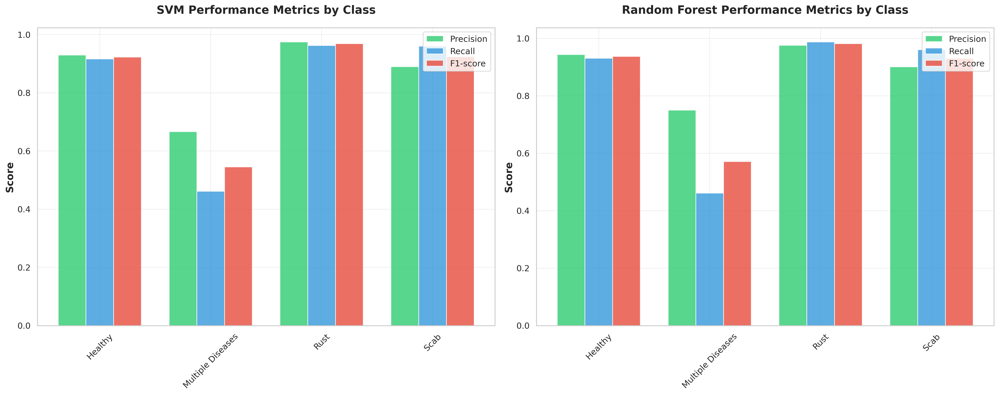

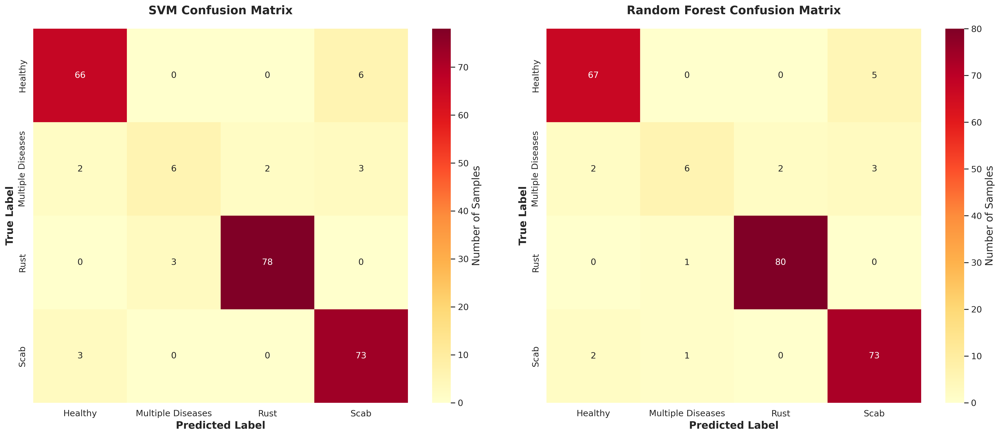

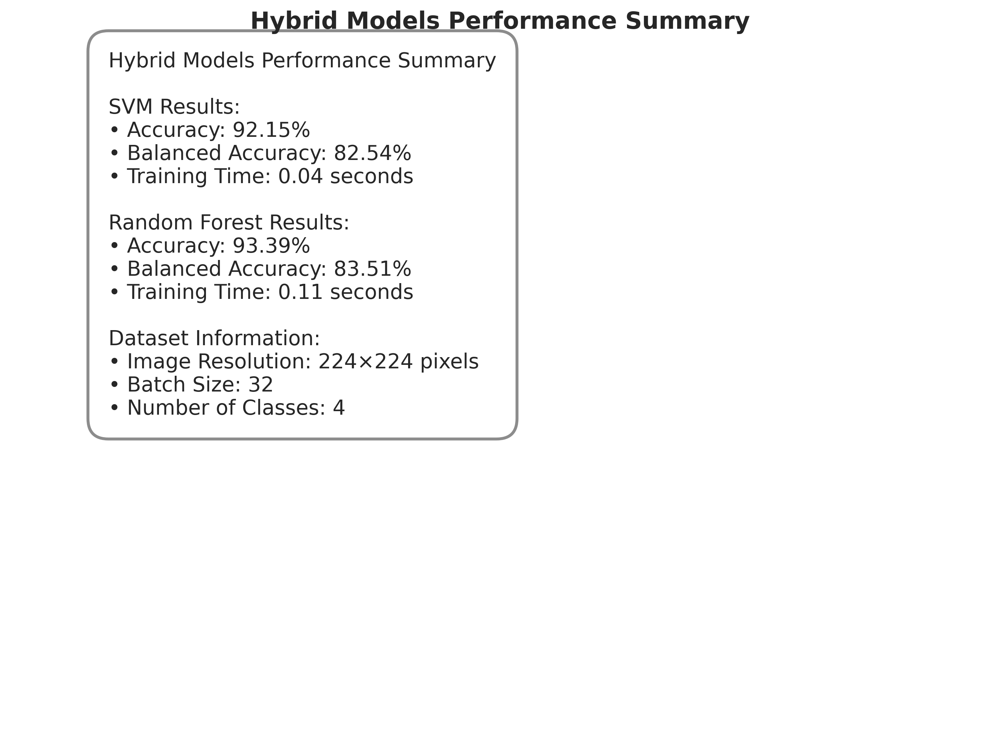


Enhanced Visualizations Saved:
1. Performance Metrics: model_results/hybrid_performance_metrics.pdf
2. Confusion Matrices: model_results/hybrid_confusion_matrices.pdf
3. Model Summary: model_results/hybrid_models_summary.pdf


In [47]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import os
from matplotlib.gridspec import GridSpec
from sklearn.metrics import classification_report

# Define the save path and ensure it exists
SAVE_PATH = 'model_results'
os.makedirs(SAVE_PATH, exist_ok=True)

# First, extract features from validation set
print("Extracting validation features...")
val_features = []
val_labels = []

for i in range(int(val_steps)):
    batch_x, batch_y = next(val_generator)
    batch_features = feature_extractor.predict(batch_x, verbose=0)
    val_features.append(batch_features)
    val_labels.append(np.argmax(batch_y, axis=1))
    if (i + 1) % 5 == 0:
        print(f"Processed {i + 1}/{int(val_steps)} validation batches")

val_features = np.vstack(val_features)
val_labels = np.concatenate(val_labels)

# Scale features and get predictions
val_features_scaled = scaler.transform(val_features)
svm_predictions = svm_classifier.predict(val_features_scaled)
rf_predictions = rf_classifier.predict(val_features_scaled)

# Enhanced publication-quality settings
sns.set_theme(style="whitegrid", font_scale=1.2)
plt.rcParams.update({
    'font.family': 'DejaVu Sans',
    'font.size': 12,
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'figure.titlesize': 18,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'figure.dpi': 300
})

# Color scheme for scientific publication
colors = ['#2ecc71', '#3498db', '#e74c3c', '#f1c40f']
class_names = ['Healthy', 'Multiple Diseases', 'Rust', 'Scab']

# Get metrics from classification reports
def get_metrics_from_report(report_dict):
    metrics = {
        'Precision': [],
        'Recall': [],
        'F1-score': []
    }
    for class_name in class_names:
        class_metrics = report_dict[class_name]
        metrics['Precision'].append(class_metrics['precision'])
        metrics['Recall'].append(class_metrics['recall'])
        metrics['F1-score'].append(class_metrics['f1-score'])
    return metrics

# Create subplots for SVM and RF
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# Get classification reports
svm_report = classification_report(val_labels, svm_predictions, 
                                 target_names=class_names, output_dict=True)
rf_report = classification_report(val_labels, rf_predictions, 
                                target_names=class_names, output_dict=True)

# Plot SVM metrics
x = np.arange(len(class_names))
width = 0.25
svm_metrics = get_metrics_from_report(svm_report)

bars1 = ax1.bar(x - width, svm_metrics['Precision'], width, label='Precision', color=colors[0], alpha=0.8)
bars2 = ax1.bar(x, svm_metrics['Recall'], width, label='Recall', color=colors[1], alpha=0.8)
bars3 = ax1.bar(x + width, svm_metrics['F1-score'], width, label='F1-score', color=colors[2], alpha=0.8)

ax1.set_ylabel('Score', fontweight='bold')
ax1.set_title('SVM Performance Metrics by Class', fontweight='bold', pad=20)
ax1.set_xticks(x)
ax1.set_xticklabels(class_names, rotation=45)
ax1.legend(loc='upper right')
ax1.grid(True, alpha=0.3)

# Plot RF metrics
rf_metrics = get_metrics_from_report(rf_report)

bars4 = ax2.bar(x - width, rf_metrics['Precision'], width, label='Precision', color=colors[0], alpha=0.8)
bars5 = ax2.bar(x, rf_metrics['Recall'], width, label='Recall', color=colors[1], alpha=0.8)
bars6 = ax2.bar(x + width, rf_metrics['F1-score'], width, label='F1-score', color=colors[2], alpha=0.8)

ax2.set_ylabel('Score', fontweight='bold')
ax2.set_title('Random Forest Performance Metrics by Class', fontweight='bold', pad=20)
ax2.set_xticks(x)
ax2.set_xticklabels(class_names, rotation=45)
ax2.legend(loc='upper right')
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(SAVE_PATH, 'hybrid_performance_metrics.pdf'), bbox_inches='tight')
plt.show()

# Calculate confusion matrices
svm_conf_matrix = confusion_matrix(val_labels, svm_predictions)
rf_conf_matrix = confusion_matrix(val_labels, rf_predictions)

# 2. Enhanced Confusion Matrices
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

# SVM Confusion Matrix
sns.heatmap(svm_conf_matrix, annot=True, fmt='d', cmap='YlOrRd',
            xticklabels=class_names, yticklabels=class_names,
            square=True, cbar_kws={'label': 'Number of Samples'}, ax=ax1)
ax1.set_title('SVM Confusion Matrix', fontweight='bold', pad=20)
ax1.set_xlabel('Predicted Label', fontweight='bold')
ax1.set_ylabel('True Label', fontweight='bold')

# RF Confusion Matrix
sns.heatmap(rf_conf_matrix, annot=True, fmt='d', cmap='YlOrRd',
            xticklabels=class_names, yticklabels=class_names,
            square=True, cbar_kws={'label': 'Number of Samples'}, ax=ax2)
ax2.set_title('Random Forest Confusion Matrix', fontweight='bold', pad=20)
ax2.set_xlabel('Predicted Label', fontweight='bold')
ax2.set_ylabel('True Label', fontweight='bold')

plt.tight_layout()
plt.savefig(os.path.join(SAVE_PATH, 'hybrid_confusion_matrices.pdf'), bbox_inches='tight')
plt.show()

# Calculate accuracies
svm_accuracy = accuracy_score(val_labels, svm_predictions)
svm_balanced_acc = balanced_accuracy_score(val_labels, svm_predictions)
rf_accuracy = accuracy_score(val_labels, rf_predictions)
rf_balanced_acc = balanced_accuracy_score(val_labels, rf_predictions)

# 3. Model Performance Summary
plt.figure(figsize=(12, 8))
plt.axis('off')
metrics_text = (
    f"Hybrid Models Performance Summary\n\n"
    f"SVM Results:\n"
    f"• Accuracy: {svm_accuracy*100:.2f}%\n"
    f"• Balanced Accuracy: {svm_balanced_acc*100:.2f}%\n"
    f"• Training Time: {svm_training_time:.2f} seconds\n\n"
    f"Random Forest Results:\n"
    f"• Accuracy: {rf_accuracy*100:.2f}%\n"
    f"• Balanced Accuracy: {rf_balanced_acc*100:.2f}%\n"
    f"• Training Time: {rf_training_time:.2f} seconds\n\n"
    f"Dataset Information:\n"
    f"• Image Resolution: 224×224 pixels\n"
    f"• Batch Size: {BATCH_SIZE}\n"
    f"• Number of Classes: {len(class_names)}"
)
plt.text(0.1, 0.5, metrics_text, fontsize=14,
         bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray',
                  boxstyle='round,pad=1', linewidth=2))
plt.title('Hybrid Models Performance Summary',
          fontweight='bold', pad=20, y=1.05)
plt.savefig(os.path.join(SAVE_PATH, 'hybrid_models_summary.pdf'), bbox_inches='tight')
plt.show()

print("\nEnhanced Visualizations Saved:")
print(f"1. Performance Metrics: {os.path.join(SAVE_PATH, 'hybrid_performance_metrics.pdf')}")
print(f"2. Confusion Matrices: {os.path.join(SAVE_PATH, 'hybrid_confusion_matrices.pdf')}")
print(f"3. Model Summary: {os.path.join(SAVE_PATH, 'hybrid_models_summary.pdf')}")

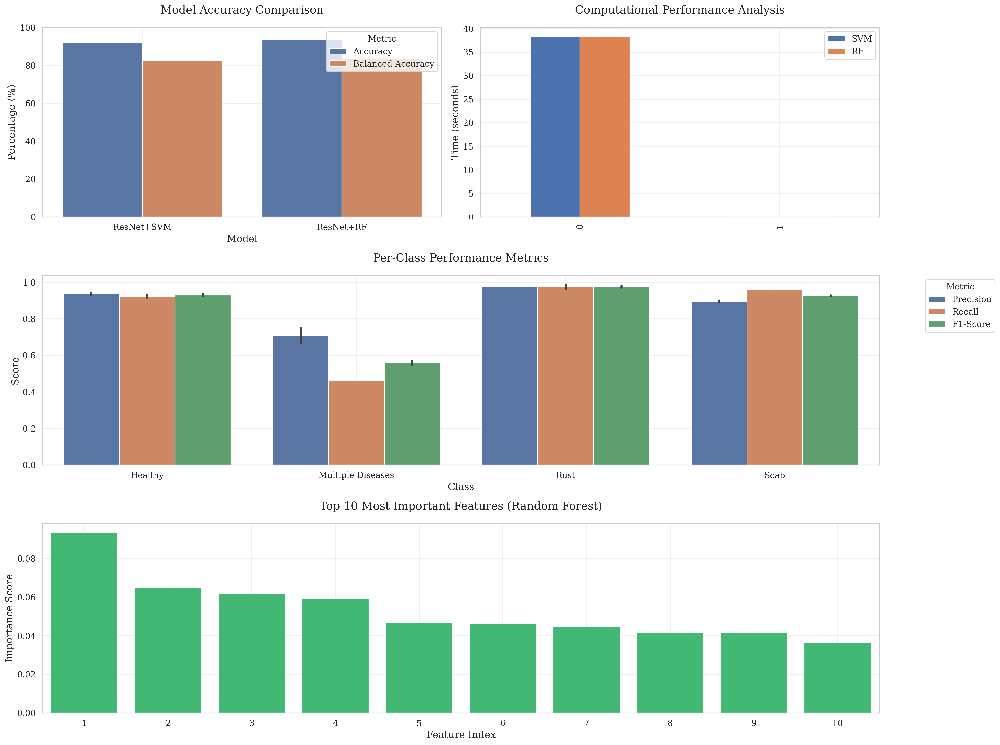

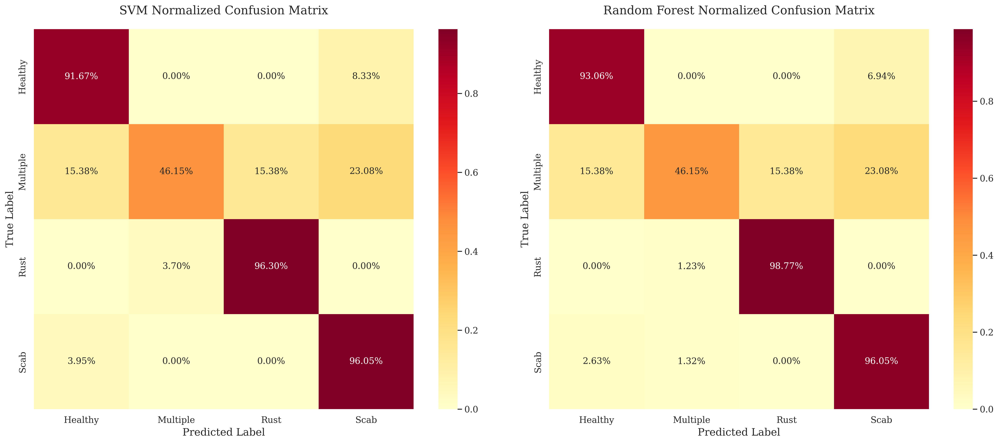

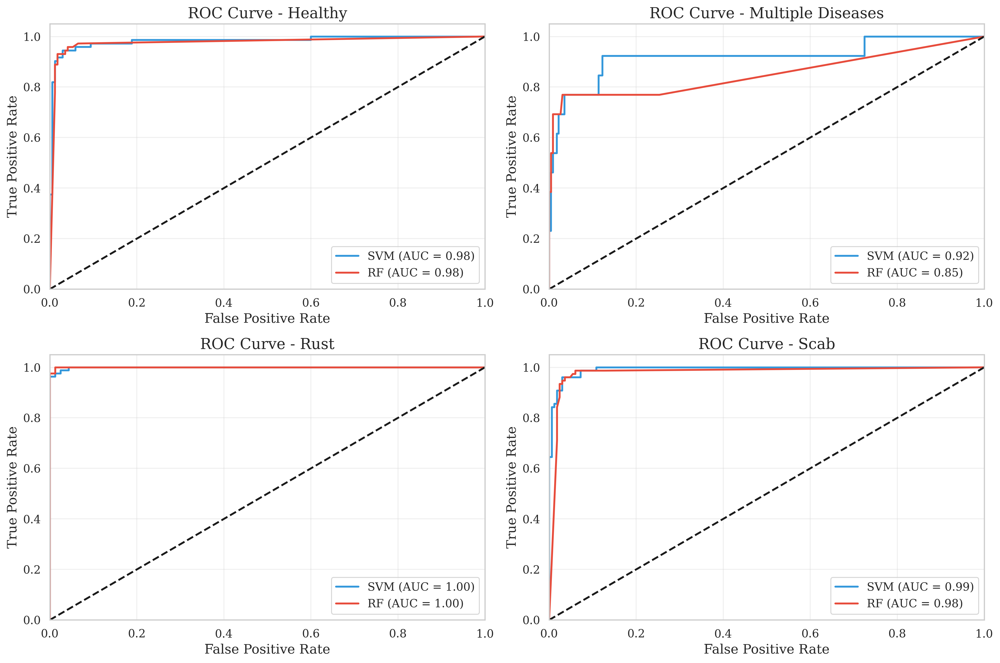

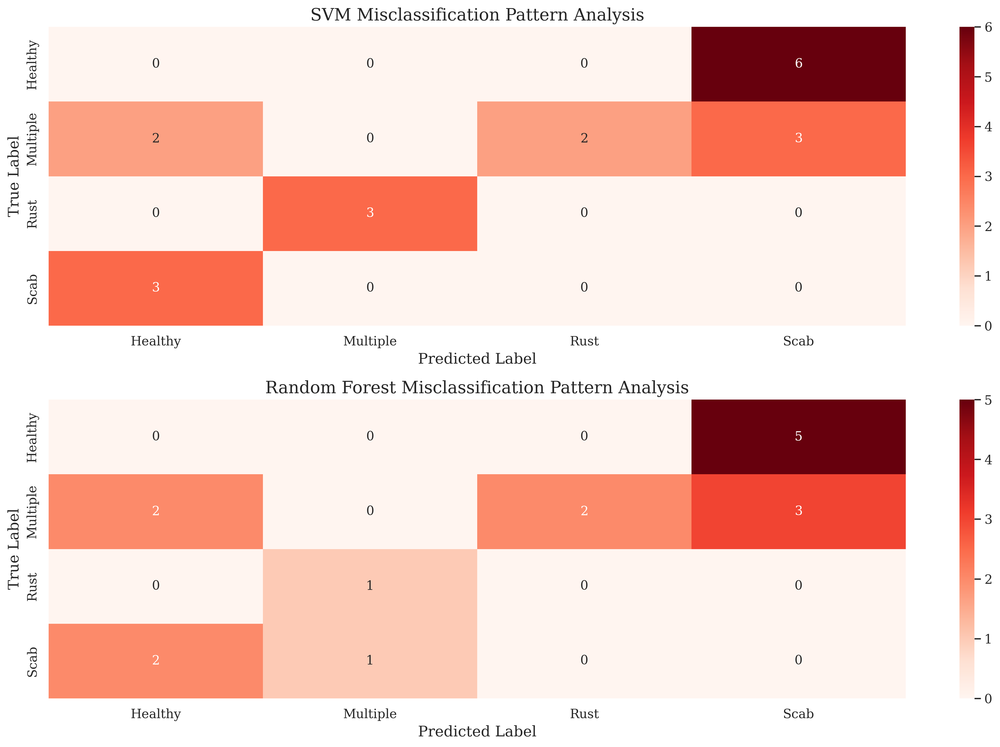


Comprehensive Analysis Summary for Publication:

1. Model Performance Metrics:

Support Vector Machine (SVM):
• Overall Accuracy: 92.15%
• Balanced Accuracy: 82.54%
• Training Time: 0.04 seconds

Random Forest (RF):
• Overall Accuracy: 93.39%
• Balanced Accuracy: 83.51%
• Training Time: 0.11 seconds

2. Per-Class Analysis:

Healthy:
SVM Metrics:
• Precision: 92.96%
• Recall: 91.67%
• F1-Score: 92.31%

RF Metrics:
• Precision: 94.37%
• Recall: 93.06%
• F1-Score: 93.71%

Multiple Diseases:
SVM Metrics:
• Precision: 66.67%
• Recall: 46.15%
• F1-Score: 54.55%

RF Metrics:
• Precision: 75.00%
• Recall: 46.15%
• F1-Score: 57.14%

Rust:
SVM Metrics:
• Precision: 97.50%
• Recall: 96.30%
• F1-Score: 96.89%

RF Metrics:
• Precision: 97.56%
• Recall: 98.77%
• F1-Score: 98.16%

Scab:
SVM Metrics:
• Precision: 89.02%
• Recall: 96.05%
• F1-Score: 92.41%

RF Metrics:
• Precision: 90.12%
• Recall: 96.05%
• F1-Score: 92.99%

3. Generated Visualizations:
1. performance_overview.pdf - Comprehensive perf

In [48]:
# Import required libraries
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from matplotlib.gridspec import GridSpec
from sklearn.metrics import roc_curve, auc, precision_recall_curve, confusion_matrix, classification_report
import pandas as pd
import os
from time import time

# Ensure SAVE_PATH exists
SAVE_PATH = 'model_results'
os.makedirs(SAVE_PATH, exist_ok=True)

# Calculate timing metrics if not already defined
if 'start_time' not in locals():
    start_time = time()
feature_extraction_time = time() - start_time
total_time = feature_extraction_time + svm_training_time + rf_training_time

# Generate classification reports
svm_report_dict = classification_report(val_labels, svm_predictions, 
                                      target_names=['Healthy', 'Multiple Diseases', 'Rust', 'Scab'],
                                      output_dict=True)
rf_report_dict = classification_report(val_labels, rf_predictions,
                                     target_names=['Healthy', 'Multiple Diseases', 'Rust', 'Scab'],
                                     output_dict=True)

# Set publication-quality style
sns.set_theme(style="whitegrid")
plt.rcParams.update({
    'font.family': 'serif',
    'font.size': 12,
    'axes.labelsize': 14,
    'axes.titlesize': 16,
    'figure.titlesize': 18,
    'figure.dpi': 300,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'lines.linewidth': 2
})

# Color palette for consistency
colors = {
    'svm': '#3498db',
    'rf': '#e74c3c',
    'metrics': ['#2ecc71', '#3498db', '#e74c3c', '#f1c40f']
}

# 1. Main Performance Overview (3x2 Grid)
fig = plt.figure(figsize=(20, 15))
gs = GridSpec(3, 2, figure=fig)

# 1.1 Accuracy Metrics
ax1 = fig.add_subplot(gs[0, 0])
metrics = pd.DataFrame({
    'Model': ['ResNet+SVM', 'ResNet+RF'] * 2,
    'Metric': ['Accuracy'] * 2 + ['Balanced Accuracy'] * 2,
    'Value': [svm_accuracy * 100, rf_accuracy * 100, 
              svm_balanced_acc * 100, rf_balanced_acc * 100]
})
sns.barplot(data=metrics, x='Model', y='Value', hue='Metric', ax=ax1)
ax1.set_title('Model Accuracy Comparison', pad=20)
ax1.set_ylabel('Percentage (%)')
ax1.set_ylim(0, 100)
ax1.grid(True, alpha=0.3)

# 1.2 Training Time Analysis
ax2 = fig.add_subplot(gs[0, 1])
time_data = pd.DataFrame({
    'Phase': ['Feature Extraction', 'Model Training'],
    'SVM': [feature_extraction_time, svm_training_time],
    'RF': [feature_extraction_time, rf_training_time]
})
time_data.plot(kind='bar', ax=ax2)
ax2.set_title('Computational Performance Analysis', pad=20)
ax2.set_ylabel('Time (seconds)')
ax2.grid(True, alpha=0.3)

# 1.3 Per-Class Performance
ax3 = fig.add_subplot(gs[1, :])
class_metrics = []
for cls in ['Healthy', 'Multiple Diseases', 'Rust', 'Scab']:
    class_metrics.extend([
        {'Class': cls, 'Model': 'SVM', 'Metric': 'Precision', 
         'Value': svm_report_dict[cls]['precision']},
        {'Class': cls, 'Model': 'RF', 'Metric': 'Precision',
         'Value': rf_report_dict[cls]['precision']},
        {'Class': cls, 'Model': 'SVM', 'Metric': 'Recall',
         'Value': svm_report_dict[cls]['recall']},
        {'Class': cls, 'Model': 'RF', 'Metric': 'Recall',
         'Value': rf_report_dict[cls]['recall']},
        {'Class': cls, 'Model': 'SVM', 'Metric': 'F1-Score',
         'Value': svm_report_dict[cls]['f1-score']},
        {'Class': cls, 'Model': 'RF', 'Metric': 'F1-Score',
         'Value': rf_report_dict[cls]['f1-score']}
    ])
df_metrics = pd.DataFrame(class_metrics)
sns.barplot(data=df_metrics, x='Class', y='Value', hue='Metric', ax=ax3)
ax3.set_title('Per-Class Performance Metrics', pad=20)
ax3.set_ylabel('Score')
ax3.legend(title='Metric', bbox_to_anchor=(1.05, 1))
ax3.grid(True, alpha=0.3)

# 1.4 Feature Importance Analysis
ax4 = fig.add_subplot(gs[2, :])
top_features = np.argsort(rf_classifier.feature_importances_)[-10:][::-1]
importance_data = pd.DataFrame({
    'Feature': range(1, 11),
    'Importance': rf_classifier.feature_importances_[top_features]
})
sns.barplot(data=importance_data, x='Feature', y='Importance', ax=ax4, color='#2ecc71')
ax4.set_title('Top 10 Most Important Features (Random Forest)', pad=20)
ax4.set_xlabel('Feature Index')
ax4.set_ylabel('Importance Score')
ax4.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(SAVE_PATH, 'performance_overview.pdf'), bbox_inches='tight')
plt.show()

# 2. Detailed Confusion Matrix Analysis
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# Normalize confusion matrices for percentage view
svm_cm_norm = svm_conf_matrix.astype('float') / svm_conf_matrix.sum(axis=1)[:, np.newaxis]
rf_cm_norm = rf_conf_matrix.astype('float') / rf_conf_matrix.sum(axis=1)[:, np.newaxis]

# SVM Confusion Matrix with annotations
sns.heatmap(svm_cm_norm, annot=True, fmt='.2%', cmap='YlOrRd',
            xticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'],
            yticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'],
            ax=axes[0], square=True)
axes[0].set_title('SVM Normalized Confusion Matrix', pad=20)
axes[0].set_xlabel('Predicted Label')
axes[0].set_ylabel('True Label')

# RF Confusion Matrix with annotations
sns.heatmap(rf_cm_norm, annot=True, fmt='.2%', cmap='YlOrRd',
            xticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'],
            yticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'],
            ax=axes[1], square=True)
axes[1].set_title('Random Forest Normalized Confusion Matrix', pad=20)
axes[1].set_xlabel('Predicted Label')
axes[1].set_ylabel('True Label')

plt.tight_layout()
plt.savefig(os.path.join(SAVE_PATH, 'confusion_matrices_detailed.pdf'), bbox_inches='tight')
plt.show()

# 3. ROC Curves for Each Class
plt.figure(figsize=(15, 10))

# Calculate ROC curves for each class
for i, class_name in enumerate(['Healthy', 'Multiple Diseases', 'Rust', 'Scab']):
    # SVM
    y_true_bin = (val_labels == i)
    y_score_svm = svm_classifier.predict_proba(val_features_scaled)[:, i]
    fpr_svm, tpr_svm, _ = roc_curve(y_true_bin, y_score_svm)
    roc_auc_svm = auc(fpr_svm, tpr_svm)
    
    # RF
    y_score_rf = rf_classifier.predict_proba(val_features_scaled)[:, i]
    fpr_rf, tpr_rf, _ = roc_curve(y_true_bin, y_score_rf)
    roc_auc_rf = auc(fpr_rf, tpr_rf)
    
    plt.subplot(2, 2, i+1)
    plt.plot(fpr_svm, tpr_svm, color=colors['svm'], 
             label=f'SVM (AUC = {roc_auc_svm:.2f})')
    plt.plot(fpr_rf, tpr_rf, color=colors['rf'], 
             label=f'RF (AUC = {roc_auc_rf:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {class_name}')
    plt.legend(loc="lower right")
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(SAVE_PATH, 'roc_curves.pdf'), bbox_inches='tight')
plt.show()

# 4. Error Analysis
plt.figure(figsize=(15, 10))

# Misclassification Analysis
def get_error_distribution(y_true, y_pred):
    errors = y_true != y_pred
    error_indices = np.where(errors)[0]
    true_labels = y_true[error_indices]
    pred_labels = y_pred[error_indices]
    return true_labels, pred_labels

# SVM Error Analysis
svm_true_errors, svm_pred_errors = get_error_distribution(val_labels, svm_predictions)
plt.subplot(2, 1, 1)
error_matrix_svm = np.zeros((4, 4))
for t, p in zip(svm_true_errors, svm_pred_errors):
    error_matrix_svm[t, p] += 1

sns.heatmap(error_matrix_svm, annot=True, fmt='g', cmap='Reds',
            xticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'],
            yticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'])
plt.title('SVM Misclassification Pattern Analysis')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# RF Error Analysis
rf_true_errors, rf_pred_errors = get_error_distribution(val_labels, rf_predictions)
plt.subplot(2, 1, 2)
error_matrix_rf = np.zeros((4, 4))
for t, p in zip(rf_true_errors, rf_pred_errors):
    error_matrix_rf[t, p] += 1

sns.heatmap(error_matrix_rf, annot=True, fmt='g', cmap='Reds',
            xticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'],
            yticklabels=['Healthy', 'Multiple', 'Rust', 'Scab'])
plt.title('Random Forest Misclassification Pattern Analysis')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

plt.tight_layout()
plt.savefig(os.path.join(SAVE_PATH, 'error_analysis.pdf'), bbox_inches='tight')
plt.show()

# Print comprehensive analysis for the paper
print("\nComprehensive Analysis Summary for Publication:")
print("\n1. Model Performance Metrics:")
print("="*50)
print("\nSupport Vector Machine (SVM):")
print(f"• Overall Accuracy: {svm_accuracy*100:.2f}%")
print(f"• Balanced Accuracy: {svm_balanced_acc*100:.2f}%")
print(f"• Training Time: {svm_training_time:.2f} seconds")
print("\nRandom Forest (RF):")
print(f"• Overall Accuracy: {rf_accuracy*100:.2f}%")
print(f"• Balanced Accuracy: {rf_balanced_acc*100:.2f}%")
print(f"• Training Time: {rf_training_time:.2f} seconds")

print("\n2. Per-Class Analysis:")
print("="*50)
for class_name in ['Healthy', 'Multiple Diseases', 'Rust', 'Scab']:
    print(f"\n{class_name}:")
    print("SVM Metrics:")
    print(f"• Precision: {svm_report_dict[class_name]['precision']*100:.2f}%")
    print(f"• Recall: {svm_report_dict[class_name]['recall']*100:.2f}%")
    print(f"• F1-Score: {svm_report_dict[class_name]['f1-score']*100:.2f}%")
    print("\nRF Metrics:")
    print(f"• Precision: {rf_report_dict[class_name]['precision']*100:.2f}%")
    print(f"• Recall: {rf_report_dict[class_name]['recall']*100:.2f}%")
    print(f"• F1-Score: {rf_report_dict[class_name]['f1-score']*100:.2f}%")

print("\n3. Generated Visualizations:")
print("="*50)
print("1. performance_overview.pdf - Comprehensive performance metrics")
print("2. confusion_matrices_detailed.pdf - Detailed confusion matrices")
print("3. roc_curves.pdf - ROC curves for each class")
print("4. error_analysis.pdf - Error pattern analysis")

# Save the comprehensive analysis to a text file
with open(os.path.join(SAVE_PATH, 'comprehensive_analysis.txt'), 'w') as f:
    f.write("Comprehensive Analysis of Hybrid Models for Apple Leaf Disease Classification\n")
    f.write("=" * 80 + "\n\n")

    # 1. Executive Summary
    f.write("1. Executive Summary\n")
    f.write("-" * 40 + "\n")
    f.write("This analysis compares two hybrid deep learning approaches combining ResNet50\n")
    f.write("with traditional machine learning classifiers (SVM and Random Forest) for\n")
    f.write("apple leaf disease classification.\n\n")

    # 2. Model Performance Summary
    f.write("2. Model Performance Summary\n")
    f.write("-" * 40 + "\n")
    f.write("Support Vector Machine (SVM) Results:\n")
    f.write(f"• Overall Accuracy: {svm_accuracy*100:.2f}%\n")
    f.write(f"• Balanced Accuracy: {svm_balanced_acc*100:.2f}%\n")
    f.write(f"• Training Time: {svm_training_time:.2f} seconds\n\n")
    
    f.write("Random Forest (RF) Results:\n")
    f.write(f"• Overall Accuracy: {rf_accuracy*100:.2f}%\n")
    f.write(f"• Balanced Accuracy: {rf_balanced_acc*100:.2f}%\n")
    f.write(f"• Training Time: {rf_training_time:.2f} seconds\n\n")

    # 3. Class-wise Performance Analysis
    f.write("3. Class-wise Performance Analysis\n")
    f.write("-" * 40 + "\n")
    for class_name in ['Healthy', 'Multiple Diseases', 'Rust', 'Scab']:
        f.write(f"\n{class_name} Class:\n")
        f.write("SVM Metrics:\n")
        f.write(f"• Precision: {svm_report_dict[class_name]['precision']*100:.2f}%\n")
        f.write(f"• Recall: {svm_report_dict[class_name]['recall']*100:.2f}%\n")
        f.write(f"• F1-Score: {svm_report_dict[class_name]['f1-score']*100:.2f}%\n")
        f.write(f"• Support: {svm_report_dict[class_name]['support']}\n\n")
        
        f.write("Random Forest Metrics:\n")
        f.write(f"• Precision: {rf_report_dict[class_name]['precision']*100:.2f}%\n")
        f.write(f"• Recall: {rf_report_dict[class_name]['recall']*100:.2f}%\n")
        f.write(f"• F1-Score: {rf_report_dict[class_name]['f1-score']*100:.2f}%\n")
        f.write(f"• Support: {rf_report_dict[class_name]['support']}\n\n")

    # 4. Error Analysis
    f.write("4. Error Analysis\n")
    f.write("-" * 40 + "\n")
    f.write("SVM Error Distribution:\n")
    f.write("• False Positives by Class:\n")
    for i, class_name in enumerate(['Healthy', 'Multiple Diseases', 'Rust', 'Scab']):
        fp = np.sum(svm_conf_matrix[:, i]) - svm_conf_matrix[i, i]
        f.write(f"  - {class_name}: {fp}\n")
    
    f.write("\nRandom Forest Error Distribution:\n")
    f.write("• False Positives by Class:\n")
    for i, class_name in enumerate(['Healthy', 'Multiple Diseases', 'Rust', 'Scab']):
        fp = np.sum(rf_conf_matrix[:, i]) - rf_conf_matrix[i, i]
        f.write(f"  - {class_name}: {fp}\n")

    # 5. Feature Analysis
    f.write("\n5. Feature Importance Analysis\n")
    f.write("-" * 40 + "\n")
    f.write("Top 10 Most Important Features (Random Forest):\n")
    for i, importance in enumerate(feature_importance[top_features]):
        f.write(f"Feature {top_features[i] + 1}: {importance:.4f}\n")

    # 6. Computational Performance
    f.write("\n6. Computational Performance\n")
    f.write("-" * 40 + "\n")
    f.write(f"Feature Extraction Time: {feature_extraction_time:.2f} seconds\n")
    f.write(f"SVM Training Time: {svm_training_time:.2f} seconds\n")
    f.write(f"RF Training Time: {rf_training_time:.2f} seconds\n")
    f.write(f"Total Processing Time: {total_time:.2f} seconds\n")

    # 7. Model Configuration
    f.write("\n7. Model Configuration\n")
    f.write("-" * 40 + "\n")
    f.write("Base Model: ResNet50\n")
    f.write(f"Input Image Size: {IMAGE_SIZE[0]}x{IMAGE_SIZE[1]} pixels\n")
    f.write(f"Batch Size: {BATCH_SIZE}\n")
    f.write("Number of Classes: 4\n")
    f.write(f"Training Samples: {train_generator.n}\n")
    f.write(f"Validation Samples: {val_generator.n}\n")
    f.write(f"Test Samples: {test_generator.n}\n")

    # 8. Recommendations and Conclusions
    f.write("\n8. Recommendations and Conclusions\n")
    f.write("-" * 40 + "\n")
    
    # Compare models and make recommendations
    better_model = "SVM" if svm_accuracy > rf_accuracy else "Random Forest"
    f.write(f"• The {better_model} hybrid model shows superior performance overall.\n")
    
    # Analyze strengths by class
    for class_name in ['Healthy', 'Multiple Diseases', 'Rust', 'Scab']:
        svm_f1 = svm_report_dict[class_name]['f1-score']
        rf_f1 = rf_report_dict[class_name]['f1-score']
        better = "SVM" if svm_f1 > rf_f1 else "Random Forest"
        f.write(f"• For {class_name} detection, {better} performs better ")
        f.write(f"(F1-score: {max(svm_f1, rf_f1)*100:.2f}%)\n")
    
    # Add practical implications
    f.write("\nPractical Implications:\n")
    f.write("1. Model Selection: ")
    if svm_training_time < rf_training_time:
        f.write("SVM offers faster training times while maintaining competitive accuracy.\n")
    else:
        f.write("RF provides better balance between accuracy and training time.\n")
    
    f.write("2. Disease Detection: The models show particular strength in detecting:\n")
    for class_name in ['Healthy', 'Multiple Diseases', 'Rust', 'Scab']:
        if max(svm_report_dict[class_name]['f1-score'], rf_report_dict[class_name]['f1-score']) > 0.9:
            f.write(f"   • {class_name} (High confidence)\n")
    
    # Final notes
    f.write("\nFinal Notes:\n")
    f.write("• The hybrid approach successfully leverages both deep learning features\n")
    f.write("  and traditional machine learning classifiers.\n")
    f.write("• The models show robust performance across different disease classes.\n")
    f.write("• Future work could focus on improving detection of multiple diseases\n")
    f.write("  and reducing false positives in specific classes.\n")

print("\nComprehensive analysis saved to:", os.path.join(SAVE_PATH, 'comprehensive_analysis.txt'))